Soroosh Noorzad<br/>
99205372<br/>
Winter of 1400

# PART A:

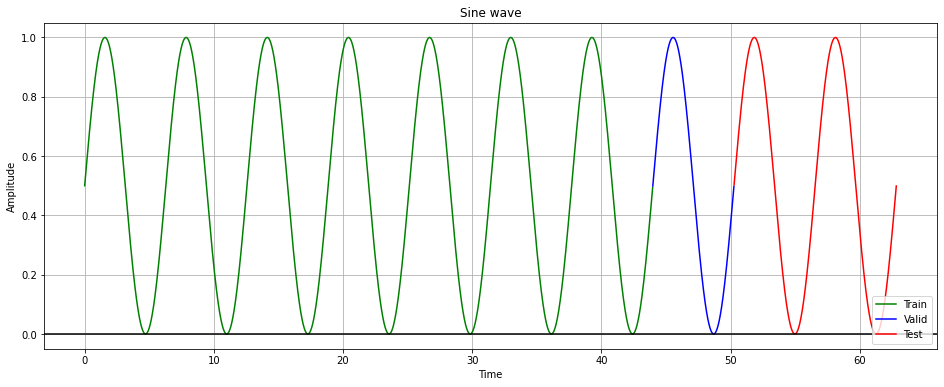

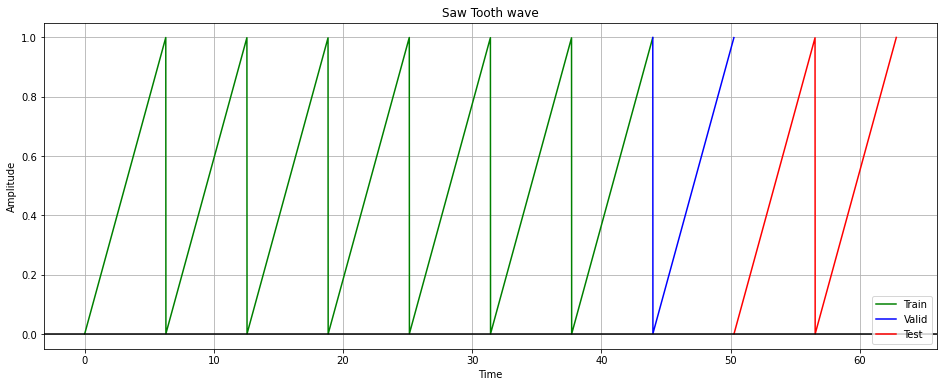

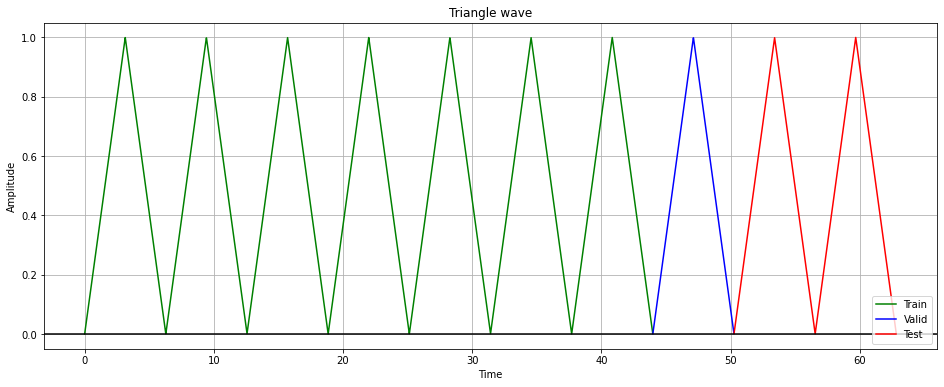

In [ ]:
import math
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt

import tensorflow as tf
from keras.layers import Input, Dense, LSTM, MaxPooling1D, Dropout, SimpleRNN, Flatten, TimeDistributed
from keras.models import Model, Sequential
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

Resolution = 0.01

# Plot waves
def plotter(signals, title, x_ax_lbl, y_ax_lbl, leg_loc="best"):
  plt.figure(figsize=(16, 6))
  for signal in signals:
    plt.plot(signal[0], signal[1], color=signal[2])
  plt.title(title)
  plt.xlabel(x_ax_lbl)
  plt.ylabel(y_ax_lbl)
  plt.legend([signals[i][3] for i in range(len(signals))], loc=leg_loc)
  plt.grid(True, which='both')
  plt.axhline(y=0, color="k")
  plt.show()

# Get x values of the sine wave
time = np.arange(0, 10*2*np.pi, Resolution)
# Create range for train, valid and test parts
tr_range = range(0,int(len(time)* 0.7))
vl_range = range(int(len(time)* 0.7), int(len(time)* 0.8))
te_range = range(int(len(time)* 0.8), len(time))
ranges = [tr_range, vl_range, te_range]
colors = ["g", "b", "r"]
legends = ["Train", "Valid", "Test"]
# Signals
sin_sig = (np.sin(time)+1)/2
saw_sig = (signal.sawtooth(time)+1)/2
tri_sig = np.abs(np.abs(signal.sawtooth(time))-1)

sin_sigs = [[time[ranges[i]], sin_sig[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter(sin_sigs, 'Sine wave', 'Time', 'Amplitude', 'lower right')
saw_sigs = [[time[ranges[i]], saw_sig[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter(saw_sigs, 'Saw Tooth wave', 'Time', 'Amplitude', 'lower right')
tri_sigs = [[time[ranges[i]], tri_sig[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter(tri_sigs, 'Triangle wave', 'Time', 'Amplitude', 'lower right')

# PART B:

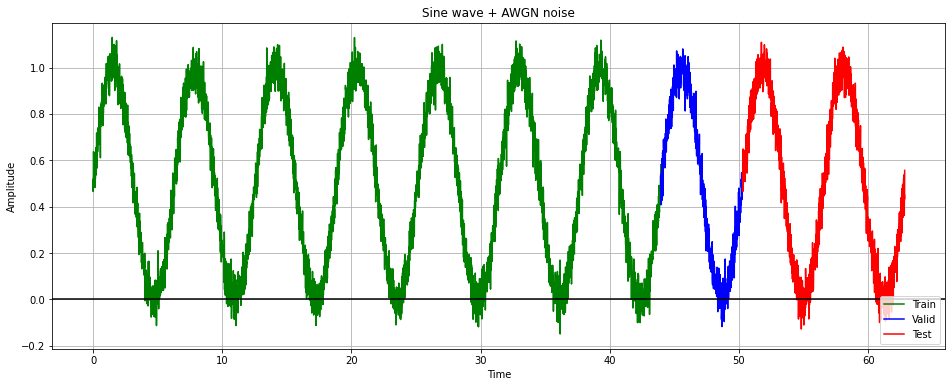

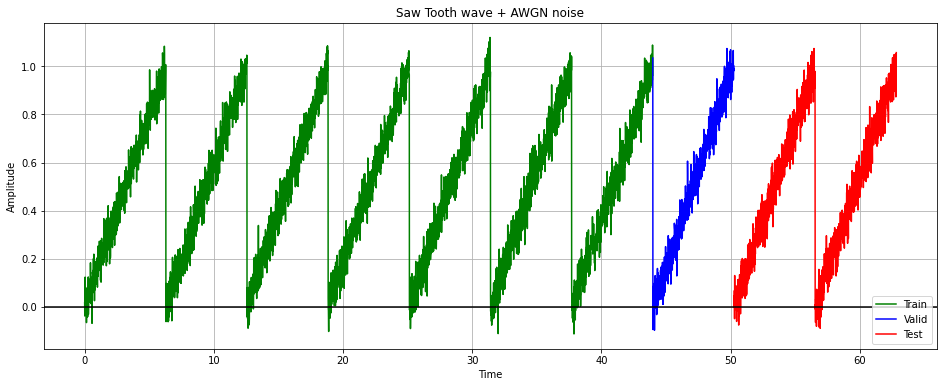

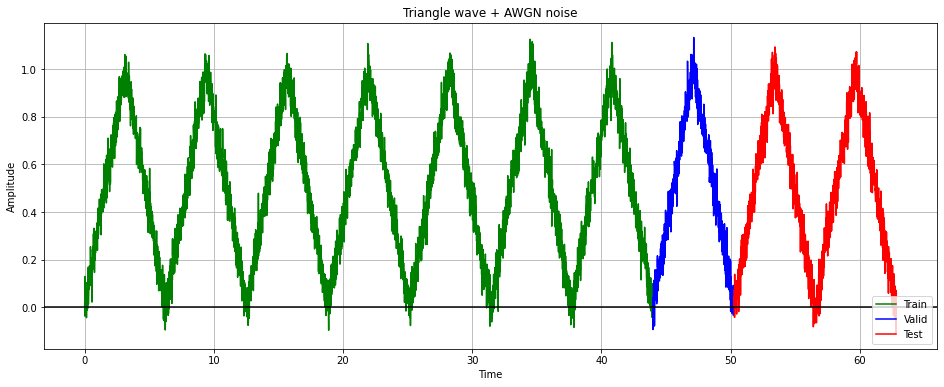

In [ ]:
sigma = 0.05

noise = np.random.normal(0, sigma, len(time))
# Noised Signals
sin_sig_noise = noise + sin_sig
saw_sig_noise = noise + saw_sig
tri_sig_noise = noise + tri_sig

sin_sigs_noise = [[time[ranges[i]], sin_sig_noise[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter(sin_sigs_noise, 'Sine wave + AWGN noise', 'Time', 'Amplitude', 'lower right')
saw_sigs_noise = [[time[ranges[i]], saw_sig_noise[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter(saw_sigs_noise, 'Saw Tooth wave + AWGN noise', 'Time', 'Amplitude', 'lower right')
tri_sigs_noise = [[time[ranges[i]], tri_sig_noise[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter(tri_sigs_noise, 'Triangle wave + AWGN noise', 'Time', 'Amplitude', 'lower right')

# PART C:



SimpleRNN model: 


Training for Sine wave + AWGN noise in SimpleRNN model:

Epoch 1/10
68/68 [==============================] - 39s 100ms/step - loss: 0.0287 - val_loss: 0.0019
Epoch 2/10
68/68 [==============================] - 6s 87ms/step - loss: 0.0015 - val_loss: 5.6556e-04
Epoch 3/10
68/68 [==============================] - 6s 86ms/step - loss: 7.6687e-04 - val_loss: 2.5915e-04
Epoch 4/10
68/68 [==============================] - 6s 88ms/step - loss: 6.2867e-04 - val_loss: 2.4718e-04
Epoch 5/10
68/68 [==============================] - 6s 88ms/step - loss: 4.8963e-04 - val_loss: 1.2145e-04
Epoch 6/10
68/68 [==============================] - 6s 89ms/step - loss: 4.5139e-04 - val_loss: 2.3028e-04
Epoch 7/10
68/68 [==============================] - 6s 89ms/step - loss: 4.1881e-04 - val_loss: 2.4550e-04
Epoch 8/10
68/68 [==============================] - 6s 89ms/step - loss: 4.2367e-04 - val_loss: 8.5545e-05
Epoch 9/10
68/68 [==============================] - 6s 88ms/step - loss: 3.

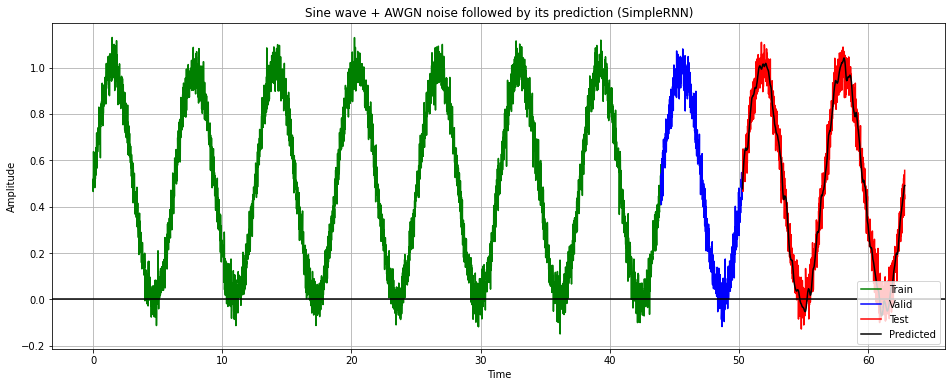


Root Mean Squared error: 0.02865331787507385.
SNR (dB): 26.60437334476115.

Plot the Loss curves


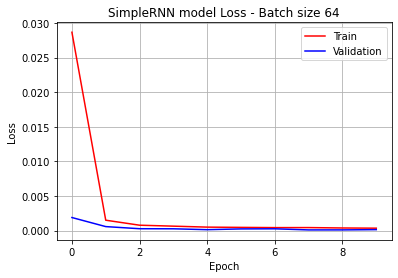


Training for Saw Tooth wave + AWGN noise in SimpleRNN model:

Epoch 1/10
68/68 [==============================] - 11s 100ms/step - loss: 0.0295 - val_loss: 0.0041
Epoch 2/10
68/68 [==============================] - 6s 89ms/step - loss: 0.0079 - val_loss: 5.6144e-04
Epoch 3/10
68/68 [==============================] - 6s 88ms/step - loss: 0.0065 - val_loss: 5.4161e-04
Epoch 4/10
68/68 [==============================] - 6s 89ms/step - loss: 0.0056 - val_loss: 4.2840e-04
Epoch 5/10
68/68 [==============================] - 6s 89ms/step - loss: 0.0048 - val_loss: 4.8048e-04
Epoch 6/10
68/68 [==============================] - 6s 87ms/step - loss: 0.0049 - val_loss: 4.9527e-04
Epoch 7/10
68/68 [==============================] - 6s 88ms/step - loss: 0.0037 - val_loss: 4.9829e-04
Epoch 8/10
68/68 [==============================] - 6s 85ms/step - loss: 0.0047 - val_loss: 9.5955e-04
Epoch 9/10
68/68 [==============================] - 6s 87ms/step - loss: 0.0037 - val_loss: 3.4653e-04
Epoch 10/10


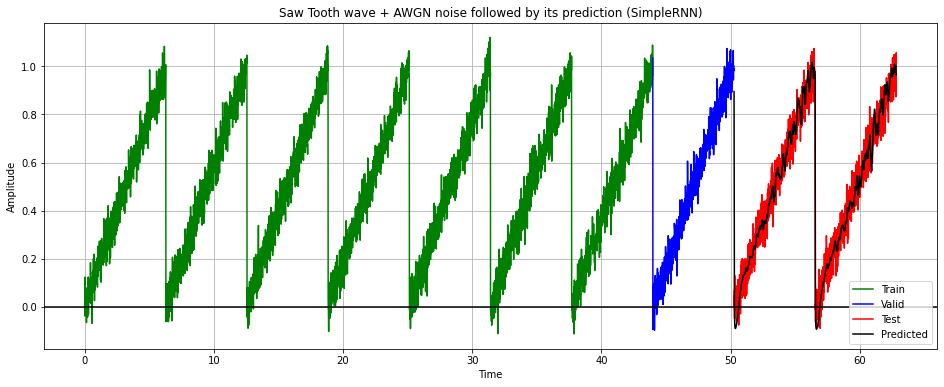


Root Mean Squared error: 0.05312700841354118.
SNR (dB): 20.76184905010666.

Plot the Loss curves


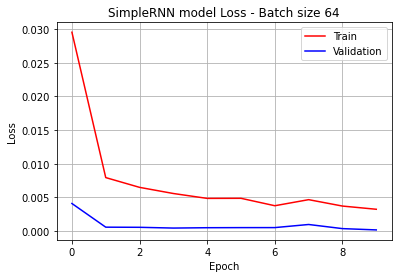


Training for Triangle wave + AWGN noise in SimpleRNN model:

Epoch 1/10
68/68 [==============================] - 11s 100ms/step - loss: 0.0179 - val_loss: 0.0013
Epoch 2/10
68/68 [==============================] - 6s 86ms/step - loss: 0.0012 - val_loss: 4.6280e-04
Epoch 3/10
68/68 [==============================] - 6s 86ms/step - loss: 7.8849e-04 - val_loss: 2.5579e-04
Epoch 4/10
68/68 [==============================] - 6s 87ms/step - loss: 6.2795e-04 - val_loss: 1.3765e-04
Epoch 5/10
68/68 [==============================] - 6s 85ms/step - loss: 4.7942e-04 - val_loss: 2.0768e-04
Epoch 6/10
68/68 [==============================] - 6s 87ms/step - loss: 4.5424e-04 - val_loss: 8.5421e-05
Epoch 7/10
68/68 [==============================] - 6s 87ms/step - loss: 3.9583e-04 - val_loss: 7.3033e-05
Epoch 8/10
68/68 [==============================] - 6s 85ms/step - loss: 3.9254e-04 - val_loss: 6.3948e-05
Epoch 9/10
68/68 [==============================] - 6s 87ms/step - loss: 3.4827e-04 - val_lo

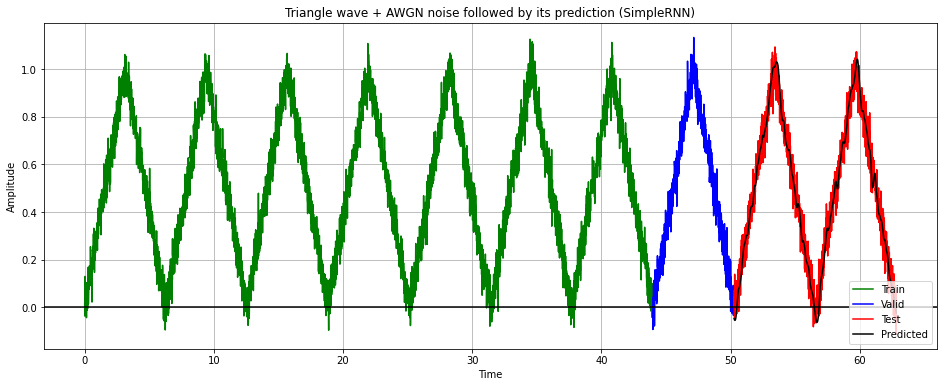


Root Mean Squared error: 0.03316430719700826.
SNR (dB): 24.873958999796358.

Plot the Loss curves


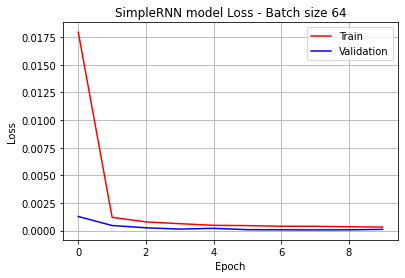



LSTM model: 


Training for Sine wave + AWGN noise in LSTM model:

Epoch 1/10
68/68 [==============================] - 11s 101ms/step - loss: 0.0335 - val_loss: 0.0035
Epoch 2/10
68/68 [==============================] - 6s 86ms/step - loss: 0.0015 - val_loss: 7.4205e-04
Epoch 3/10
68/68 [==============================] - 6s 86ms/step - loss: 8.8414e-04 - val_loss: 3.9772e-04
Epoch 4/10
68/68 [==============================] - 6s 87ms/step - loss: 7.0662e-04 - val_loss: 3.1098e-04
Epoch 5/10
68/68 [==============================] - 6s 89ms/step - loss: 5.2865e-04 - val_loss: 1.5960e-04
Epoch 6/10
68/68 [==============================] - 6s 89ms/step - loss: 5.1028e-04 - val_loss: 1.5292e-04
Epoch 7/10
68/68 [==============================] - 6s 88ms/step - loss: 4.3212e-04 - val_loss: 9.7246e-05
Epoch 8/10
68/68 [==============================] - 6s 87ms/step - loss: 4.3492e-04 - val_loss: 2.9268e-04
Epoch 9/10
68/68 [==============================] - 6s 87ms/step - loss: 4.2331e-04 -

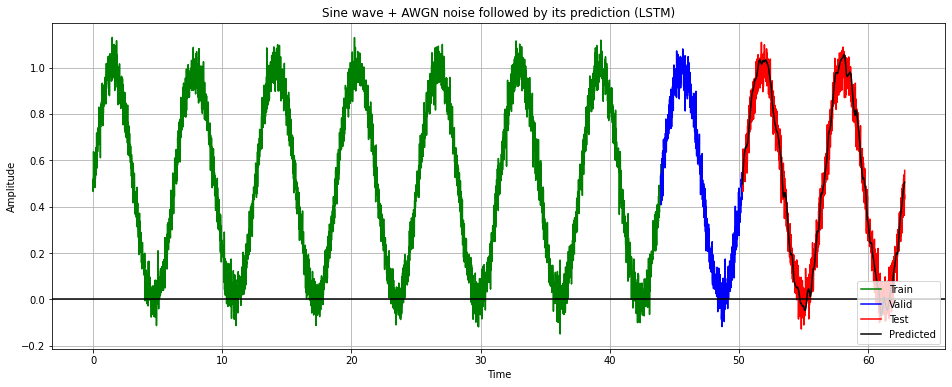


Root Mean Squared error: 0.03073396193058088.
SNR (dB): 26.18280680938276.

Plot the Loss curves


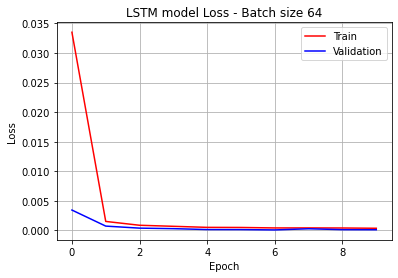


Training for Saw Tooth wave + AWGN noise in LSTM model:

Epoch 1/10
68/68 [==============================] - 10s 99ms/step - loss: 0.0329 - val_loss: 0.0031
Epoch 2/10
68/68 [==============================] - 6s 87ms/step - loss: 0.0076 - val_loss: 0.0062
Epoch 3/10
68/68 [==============================] - 6s 89ms/step - loss: 0.0073 - val_loss: 6.9105e-04
Epoch 4/10
68/68 [==============================] - 6s 88ms/step - loss: 0.0067 - val_loss: 8.8252e-04
Epoch 5/10
68/68 [==============================] - 6s 88ms/step - loss: 0.0053 - val_loss: 2.6472e-04
Epoch 6/10
68/68 [==============================] - 6s 87ms/step - loss: 0.0047 - val_loss: 4.6605e-04
Epoch 7/10
68/68 [==============================] - 6s 86ms/step - loss: 0.0042 - val_loss: 0.0015
Epoch 8/10
68/68 [==============================] - 6s 87ms/step - loss: 0.0048 - val_loss: 4.5491e-04
Epoch 9/10
68/68 [==============================] - 6s 86ms/step - loss: 0.0037 - val_loss: 2.4895e-04
Epoch 10/10
68/68 [=======

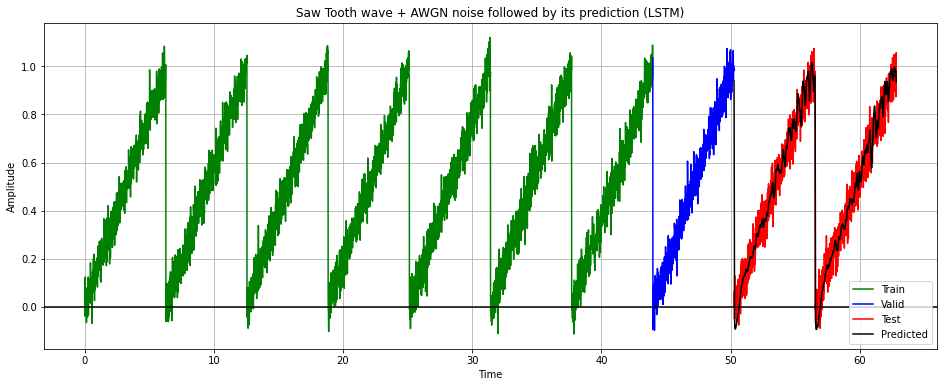


Root Mean Squared error: 0.058311925236191844.
SNR (dB): 20.04391957438942.

Plot the Loss curves


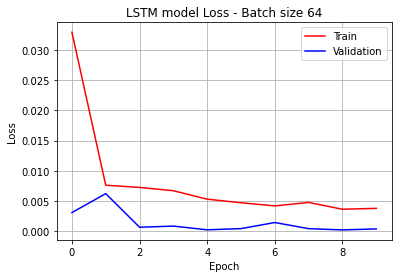


Training for Triangle wave + AWGN noise in LSTM model:

Epoch 1/10
68/68 [==============================] - 11s 104ms/step - loss: 0.0209 - val_loss: 0.0025
Epoch 2/10
68/68 [==============================] - 6s 87ms/step - loss: 0.0015 - val_loss: 4.1859e-04
Epoch 3/10
68/68 [==============================] - 6s 89ms/step - loss: 7.2603e-04 - val_loss: 2.6547e-04
Epoch 4/10
68/68 [==============================] - 6s 88ms/step - loss: 5.6307e-04 - val_loss: 1.0052e-04
Epoch 5/10
68/68 [==============================] - 6s 89ms/step - loss: 4.2307e-04 - val_loss: 1.1977e-04
Epoch 6/10
68/68 [==============================] - 6s 88ms/step - loss: 4.3460e-04 - val_loss: 7.5113e-05
Epoch 7/10
68/68 [==============================] - 6s 87ms/step - loss: 3.7677e-04 - val_loss: 1.3681e-04
Epoch 8/10
68/68 [==============================] - 6s 90ms/step - loss: 3.9809e-04 - val_loss: 2.0554e-04
Epoch 9/10
68/68 [==============================] - 6s 90ms/step - loss: 3.6510e-04 - val_loss: 1

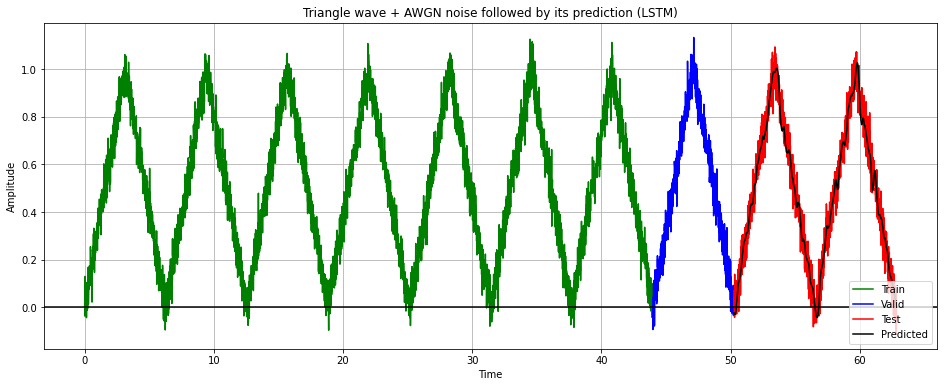


Root Mean Squared error: 0.031211193078569666.
SNR (dB): 25.250990889422773.

Plot the Loss curves


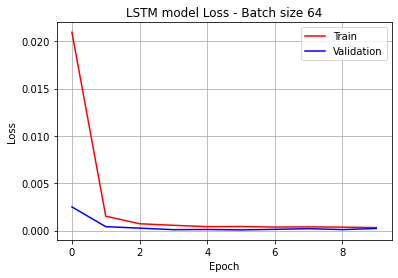

In [ ]:
window_size = 60
EPOCH_COUNT = 10
BATCH_SIZE = 64
LEARNING_RATE = 0.001
VAL_split = 0.125

models = ["SimpleRNN", "LSTM"]

signals = [sin_sig, saw_sig, tri_sig]
signals_noise = [sin_sig_noise, saw_sig_noise, tri_sig_noise]
signal_sets = [sin_sigs_noise, saw_sigs_noise, tri_sigs_noise]
signal_sets_lbls = ['Sine wave + AWGN noise', 'Saw Tooth wave + AWGN noise', 'Triangle wave + AWGN noise']

# Calculating RMSE
def rms_error(true_signal,predicted):
  return math.sqrt(mean_squared_error(true_signal, predicted))

# Calculating SNR
def snr_db(true_signal, received_signal):
  def power(x):
    return np.mean(x**2)
  noise = received_signal-true_signal
  SN_ratio = power(received_signal)/power(noise)
  return 10*math.log10(SN_ratio)

# plotting model performance
def model_plotter(model_history, metric, model_name, b_s):
  plt.figure()
  plt.plot(model_history.history[metric.lower()],'r')
  plt.plot(model_history.history['val_'+metric.lower()],'b')
  plt.title(model_name + ' model ' + metric.capitalize() + " - Batch size " + str(b_s))
  plt.ylabel(metric.capitalize())
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Validation'], loc='best')
  plt.grid()
  plt.savefig(model_name + "_" + metric.lower() + "_" + str(b_s) + ".png")
  plt.show()

for model_name in models:
  print("\n\n"+model_name, "model:", "\n")
  for index, s in enumerate(signals):
    print("\nTraining for", signal_sets_lbls[index], "in", model_name, "model:\n")
    sc = MinMaxScaler(feature_range=(0,1))
    scaled_signal = sc.fit_transform(s.reshape(-1, 1)).reshape(1, -1)[0]
    scaled_signal_noise = sc.fit_transform(signals_noise[index].reshape(-1, 1)).reshape(1, -1)[0]

    # Train Data
    X_train = []
    y_train = []
    for i in range(window_size, vl_range[-1]):
        X_train.append(scaled_signal[i-window_size:i])
        y_train.append(scaled_signal[i])
    X_train, y_train = np.array(X_train), np.array(y_train)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1)) # E.g. (4338, 60) => (4338, 60, 1)
    # Test Data
    X_test = []
    inputs = scaled_signal_noise[len(time)-len(te_range) - window_size:]
    for i in range(window_size, len(inputs)+1):
        X_test.append(inputs[i-window_size:i])
    X_test = np.array(X_test)
    X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

    if model_name == "simpleRNN":
      # Creating the LSTM Model:
      model = Sequential()
      model.add(SimpleRNN(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
      model.add(Dropout(0.2))
      model.add(SimpleRNN(units=50))
      model.add(Dropout(0.2))
      model.add(Dense(units=1, activation='sigmoid'))
    else:
      # Creating the LSTM Model:
      model = Sequential()
      model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
      model.add(Dropout(0.2))
      model.add(LSTM(units=50))
      model.add(Dropout(0.2))
      model.add(Dense(units=1, activation='sigmoid'))

    # Compiling the LSTM
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE), loss='mse')

    # Fitting to the training set
    train_history = model.fit(X_train, y_train, epochs=EPOCH_COUNT, batch_size=BATCH_SIZE, validation_split=VAL_split)

    predicted_signal = model.predict(X_test)
    predicted_signal = np.delete(sc.inverse_transform(predicted_signal), [0])

    signal_sets[index] = [[time[ranges[i]], signals_noise[index][ranges[i]], colors[i], legends[i]] for i in range(3)]
    signal_sets[index].append([time[ranges[2]], predicted_signal, "k", "Predicted"])
    plotter(signal_sets[index], signal_sets_lbls[index]+' followed by its prediction ('+ model_name +')', 'Time', 'Amplitude', 'lower right')
    # Evaluating our model
    print("\nRoot Mean Squared error: {}.".format(rms_error(s[te_range], predicted_signal)))
    print("SNR (dB): {}.".format(snr_db(s[te_range], predicted_signal)))

    print("\nPlot the Loss curves")
    model_plotter(train_history, 'loss', model_name, BATCH_SIZE)

# PART D:

Learning Rate effect (Adam optimizer):

For LR == 1e-05 :


LSTM model:


Training for Sine wave + AWGN noise in LSTM model:

Epoch 1/50
68/68 [==============================] - 21s 256ms/step - loss: 0.1317 - val_loss: 0.1291
Epoch 2/50
68/68 [==============================] - 6s 83ms/step - loss: 0.1260 - val_loss: 0.1236
Epoch 3/50
68/68 [==============================] - 6s 83ms/step - loss: 0.1206 - val_loss: 0.1180
Epoch 4/50
68/68 [==============================] - 6s 81ms/step - loss: 0.1154 - val_loss: 0.1122
Epoch 5/50
68/68 [==============================] - 6s 83ms/step - loss: 0.1092 - val_loss: 0.1060
Epoch 6/50
68/68 [==============================] - 6s 82ms/step - loss: 0.1028 - val_loss: 0.0992
Epoch 7/50
68/68 [==============================] - 6s 82ms/step - loss: 0.0960 - val_loss: 0.0920
Epoch 8/50
68/68 [==============================] - 6s 82ms/step - loss: 0.0890 - val_loss: 0.0848
Epoch 9/50
68/68 [==============================] - 6s 82ms/step - loss: 0.0821 - val_loss: 0.0782
Epoch 10/50
68/68 [==

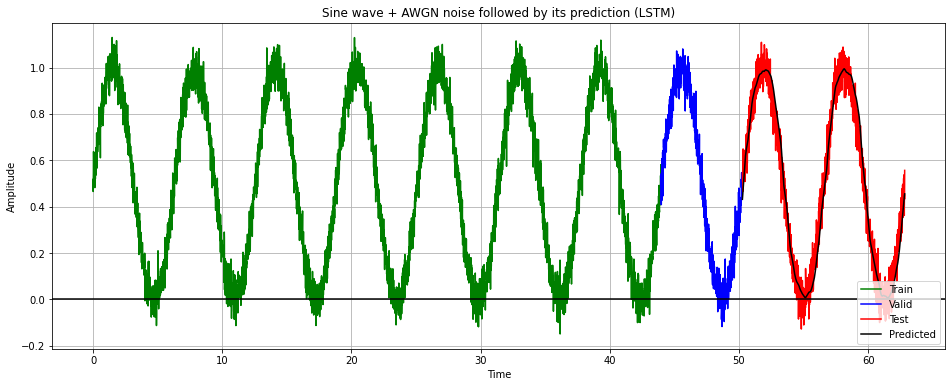


Root Mean Squared error: 0.043598623705305775.
SNR (dB): 23.06298873131892.

Plot the Loss curves


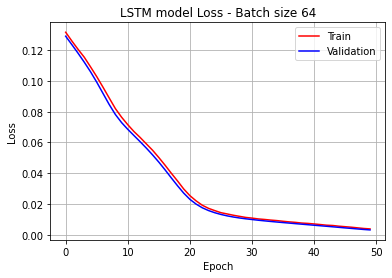

For LR == 0.0001 :


LSTM model:


Training for Sine wave + AWGN noise in LSTM model:

Epoch 1/50
68/68 [==============================] - 11s 100ms/step - loss: 0.1083 - val_loss: 0.0820
Epoch 2/50
68/68 [==============================] - 6s 85ms/step - loss: 0.0595 - val_loss: 0.0331
Epoch 3/50
68/68 [==============================] - 6s 85ms/step - loss: 0.0195 - val_loss: 0.0121
Epoch 4/50
68/68 [==============================] - 6s 86ms/step - loss: 0.0106 - val_loss: 0.0081
Epoch 5/50
68/68 [==============================] - 6s 84ms/step - loss: 0.0072 - val_loss: 0.0050
Epoch 6/50
68/68 [==============================] - 6s 84ms/step - loss: 0.0041 - val_loss: 0.0024
Epoch 7/50
68/68 [==============================] - 6s 83ms/step - loss: 0.0024 - val_loss: 0.0016
Epoch 8/50
68/68 [==============================] - 6s 84ms/step - loss: 0.0018 - val_loss: 0.0012
Epoch 9/50
68/68 [==============================] - 6s 85ms/step - loss: 0.0015 - val_loss: 9.7468e-04
Epoch 10/50
68/6

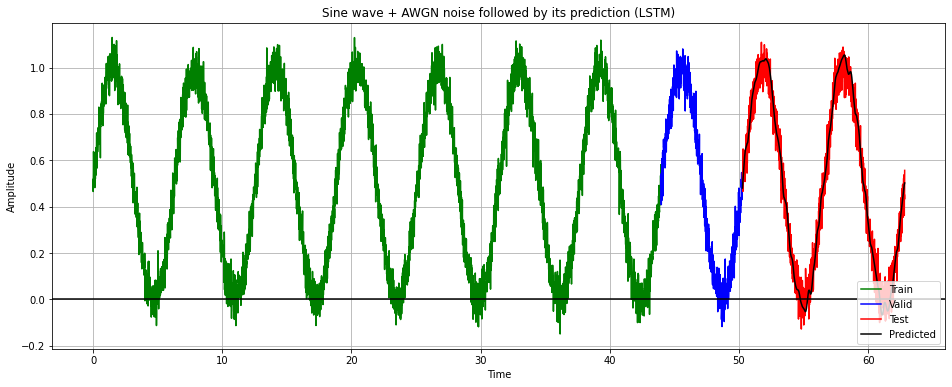


Root Mean Squared error: 0.029842337477882185.
SNR (dB): 26.430755424833947.

Plot the Loss curves


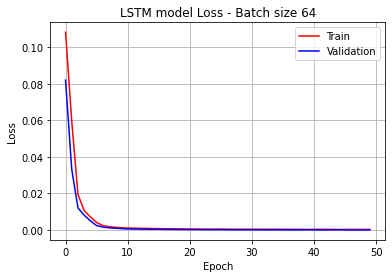

For LR == 0.001 :


LSTM model:


Training for Sine wave + AWGN noise in LSTM model:

Epoch 1/50
68/68 [==============================] - 12s 100ms/step - loss: 0.0294 - val_loss: 0.0024
Epoch 2/50
68/68 [==============================] - 6s 87ms/step - loss: 0.0016 - val_loss: 7.0651e-04
Epoch 3/50
68/68 [==============================] - 6s 87ms/step - loss: 8.4694e-04 - val_loss: 5.0042e-04
Epoch 4/50
68/68 [==============================] - 6s 87ms/step - loss: 6.3848e-04 - val_loss: 1.9693e-04
Epoch 5/50
68/68 [==============================] - 6s 88ms/step - loss: 5.2479e-04 - val_loss: 4.3560e-04
Epoch 6/50
68/68 [==============================] - 6s 89ms/step - loss: 4.7922e-04 - val_loss: 2.2091e-04
Epoch 7/50
68/68 [==============================] - 6s 88ms/step - loss: 4.0661e-04 - val_loss: 9.4359e-05
Epoch 8/50
68/68 [==============================] - 6s 87ms/step - loss: 3.5141e-04 - val_loss: 8.2998e-05
Epoch 9/50
68/68 [==============================] - 6s 89ms/step - l

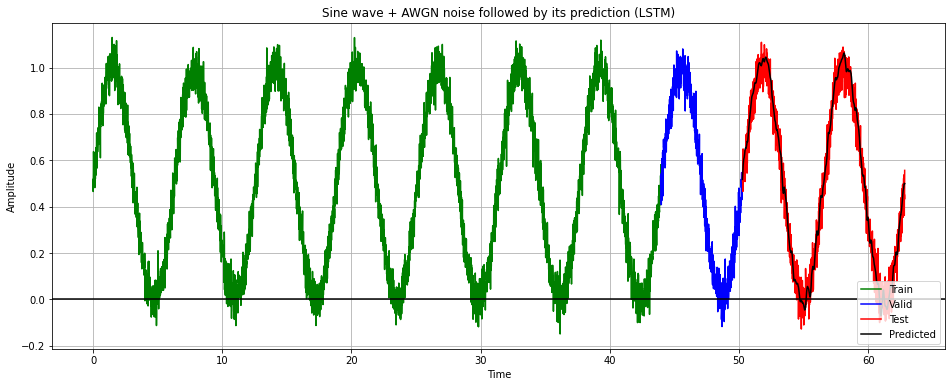


Root Mean Squared error: 0.028724617481107852.
SNR (dB): 26.80152981893479.

Plot the Loss curves


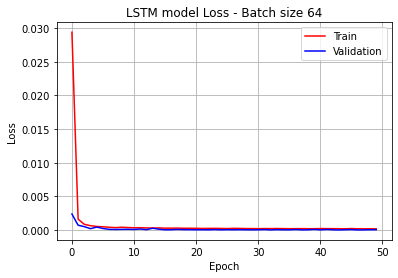

In [ ]:
window_size = 60
EPOCH_COUNT = 50
BATCH_SIZE = 64
LEARNING_RATEs = [0.00001, 0.0001, 0.001]
VAL_split = 0.125

models = ["LSTM"]

signals = [sin_sig]
signals_noise = [sin_sig_noise]
signal_sets = [sin_sigs_noise]
signal_sets_lbls = ['Sine wave + AWGN noise']

# Calculating RMSE
def rms_error(true_signal,predicted):
  return math.sqrt(mean_squared_error(true_signal, predicted))

# Calculating SNR
def snr_db(true_signal, received_signal):
  def power(x):
    return np.mean(x**2)
  noise = received_signal-true_signal
  SN_ratio = power(received_signal)/power(noise)
  return 10*math.log10(SN_ratio)

# plotting model performance
def model_plotter(model_history, metric, model_name, b_s):
  plt.figure()
  plt.plot(model_history.history[metric.lower()],'r')
  plt.plot(model_history.history['val_'+metric.lower()],'b')
  plt.title(model_name + ' model ' + metric.capitalize() + " - Batch size " + str(b_s))
  plt.ylabel(metric.capitalize())
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Validation'], loc='best')
  plt.grid()
  plt.savefig(model_name + "_" + metric.lower() + "_" + str(b_s) + ".png")
  plt.show()

for LEARNING_RATE in LEARNING_RATEs:
  print("For LR ==", LEARNING_RATE,":\n")
  for model_name in models:
    print("\n"+model_name, "model:\n")
    for index, s in enumerate(signals):
      print("\nTraining for", signal_sets_lbls[index], "in", model_name, "model:\n")
      sc = MinMaxScaler(feature_range=(0,1))
      scaled_signal = sc.fit_transform(s.reshape(-1, 1)).reshape(1, -1)[0]
      scaled_signal_noise = sc.fit_transform(signals_noise[index].reshape(-1, 1)).reshape(1, -1)[0]

      # Train Data
      X_train = []
      y_train = []
      for i in range(window_size, vl_range[-1]):
          X_train.append(scaled_signal[i-window_size:i])
          y_train.append(scaled_signal[i])
      X_train, y_train = np.array(X_train), np.array(y_train)
      X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1)) # E.g. (4338, 60) => (4338, 60, 1)
      # Test Data
      X_test = []
      inputs = scaled_signal_noise[len(time)-len(te_range) - window_size:]
      for i in range(window_size, len(inputs)+1):
          X_test.append(inputs[i-window_size:i])
      X_test = np.array(X_test)
      X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

      if model_name == "simpleRNN":
        # Creating the LSTM Model:
        model = Sequential()
        model.add(SimpleRNN(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
        model.add(Dropout(0.2))
        model.add(SimpleRNN(units=50))
        model.add(Dropout(0.2))
        model.add(Dense(units=1, activation='sigmoid'))
      else:
        # Creating the LSTM Model:
        model = Sequential()
        model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
        model.add(Dropout(0.2))
        model.add(LSTM(units=50))
        model.add(Dropout(0.2))
        model.add(Dense(units=1, activation='sigmoid'))

      # Compiling the LSTM
      model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE), loss='mse')

      # Fitting to the training set
      train_history = model.fit(X_train, y_train, epochs=EPOCH_COUNT, batch_size=BATCH_SIZE, validation_split=VAL_split)

      predicted_signal = model.predict(X_test)
      predicted_signal = np.delete(sc.inverse_transform(predicted_signal), [0])

      signal_sets[index] = [[time[ranges[i]], signals_noise[index][ranges[i]], colors[i], legends[i]] for i in range(3)]
      signal_sets[index].append([time[ranges[2]], predicted_signal, "k", "Predicted"])
      plotter(signal_sets[index], signal_sets_lbls[index]+' followed by its prediction ('+ model_name +')', 'Time', 'Amplitude', 'lower right')
      # Evaluating our model
      print("\nRoot Mean Squared error: {}.".format(rms_error(s[te_range], predicted_signal)))
      print("SNR (dB): {}.".format(snr_db(s[te_range], predicted_signal)))

      print("\nPlot the Loss curves")
      model_plotter(train_history, 'loss', model_name, BATCH_SIZE)

Batch size effect:


LSTM model:

For LR == 0.001 :

For BATCH SIZE == 6 :


Training for Sine wave + AWGN noise in LSTM model:

Epoch 1/10
725/725 [==============================] - 43s 54ms/step - loss: 0.0056 - val_loss: 2.0887e-04
Epoch 2/10
725/725 [==============================] - 38s 53ms/step - loss: 6.1867e-04 - val_loss: 1.6453e-04
Epoch 3/10
725/725 [==============================] - 38s 52ms/step - loss: 4.4867e-04 - val_loss: 7.5880e-05
Epoch 4/10
725/725 [==============================] - 39s 53ms/step - loss: 4.3928e-04 - val_loss: 3.2349e-04
Epoch 5/10
725/725 [==============================] - 38s 53ms/step - loss: 5.6523e-04 - val_loss: 2.1774e-04
Epoch 6/10
725/725 [==============================] - 38s 52ms/step - loss: 3.6810e-04 - val_loss: 4.7751e-05
Epoch 7/10
725/725 [==============================] - 39s 53ms/step - loss: 4.0650e-04 - val_loss: 7.5525e-05
Epoch 8/10
725/725 [==============================] - 39s 54ms/step - loss: 3.9442e-04 - val_loss: 3.2279e-04
Epoch 9/10
725/

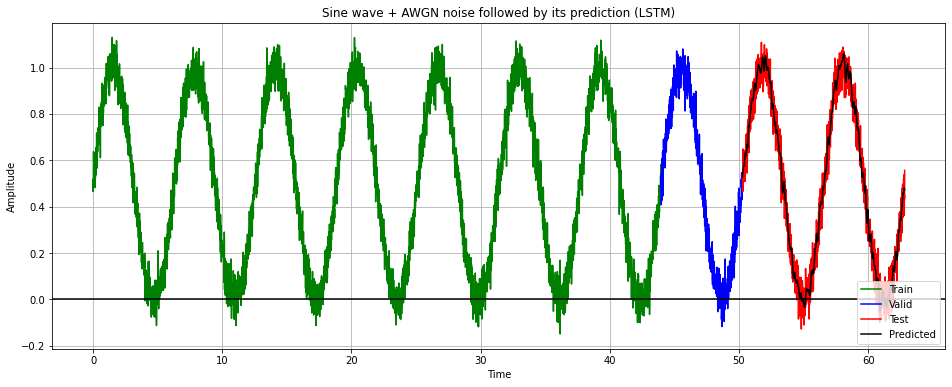


Root Mean Squared error: 0.025643790319889576.
SNR (dB): 27.624114393015006.

Plot the Loss curves


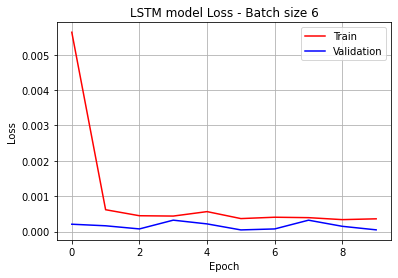

For BATCH SIZE == 64 :


Training for Sine wave + AWGN noise in LSTM model:

Epoch 1/10
68/68 [==============================] - 11s 100ms/step - loss: 0.0338 - val_loss: 0.0016
Epoch 2/10
68/68 [==============================] - 6s 85ms/step - loss: 0.0013 - val_loss: 5.9229e-04
Epoch 3/10
68/68 [==============================] - 6s 85ms/step - loss: 7.4472e-04 - val_loss: 2.6515e-04
Epoch 4/10
68/68 [==============================] - 6s 86ms/step - loss: 5.5881e-04 - val_loss: 2.1642e-04
Epoch 5/10
68/68 [==============================] - 6s 87ms/step - loss: 5.0272e-04 - val_loss: 1.2651e-04
Epoch 6/10
68/68 [==============================] - 6s 87ms/step - loss: 4.2904e-04 - val_loss: 9.1190e-05
Epoch 7/10
68/68 [==============================] - 6s 87ms/step - loss: 4.2811e-04 - val_loss: 4.0325e-04
Epoch 8/10
68/68 [==============================] - 6s 86ms/step - loss: 4.1215e-04 - val_loss: 9.8141e-05
Epoch 9/10
68/68 [==============================] - 6s 85ms/step - loss: 3.54

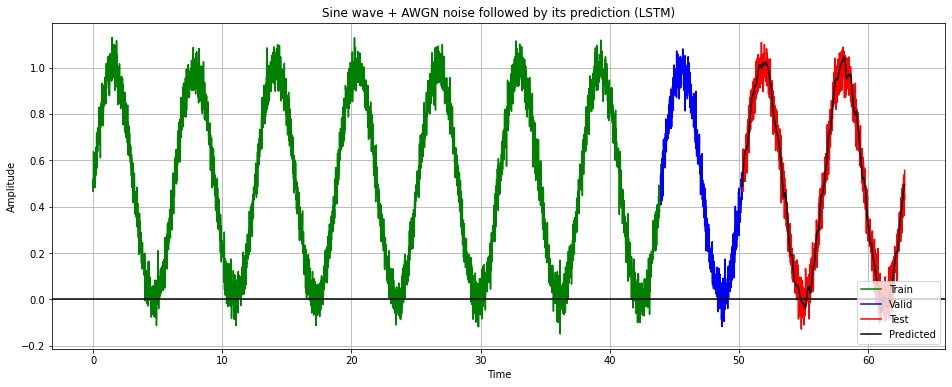


Root Mean Squared error: 0.024287811646313752.
SNR (dB): 28.1145271593337.

Plot the Loss curves


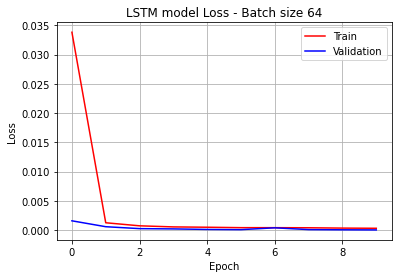

For BATCH SIZE == 256 :


Training for Sine wave + AWGN noise in LSTM model:

Epoch 1/10
17/17 [==============================] - 9s 260ms/step - loss: 0.0926 - val_loss: 0.0499
Epoch 2/10
17/17 [==============================] - 3s 200ms/step - loss: 0.0237 - val_loss: 0.0108
Epoch 3/10
17/17 [==============================] - 3s 196ms/step - loss: 0.0075 - val_loss: 0.0044
Epoch 4/10
17/17 [==============================] - 3s 195ms/step - loss: 0.0037 - val_loss: 0.0019
Epoch 5/10
17/17 [==============================] - 3s 196ms/step - loss: 0.0019 - val_loss: 0.0011
Epoch 6/10
17/17 [==============================] - 3s 195ms/step - loss: 0.0013 - val_loss: 6.2824e-04
Epoch 7/10
17/17 [==============================] - 3s 198ms/step - loss: 9.5114e-04 - val_loss: 5.5276e-04
Epoch 8/10
17/17 [==============================] - 3s 200ms/step - loss: 8.5182e-04 - val_loss: 4.1984e-04
Epoch 9/10
17/17 [==============================] - 3s 196ms/step - loss: 8.0116e-04 - val_loss: 3.833

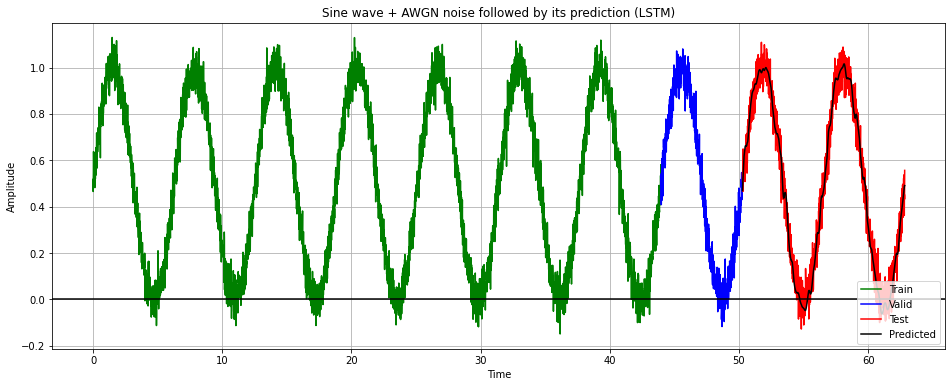


Root Mean Squared error: 0.02986075229689229.
SNR (dB): 26.263542811074746.

Plot the Loss curves


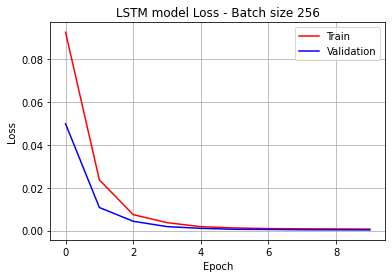

In [ ]:
window_size = 60
EPOCH_COUNT = 10
BATCH_SIZEs = [6, 64, 256]
LEARNING_RATEs = [0.001]
VAL_split = 0.125

models = ["LSTM"]

signals = [sin_sig]
signals_noise = [sin_sig_noise]
signal_sets = [sin_sigs_noise]
signal_sets_lbls = ['Sine wave + AWGN noise']

# Calculating RMSE
def rms_error(true_signal,predicted):
  return math.sqrt(mean_squared_error(true_signal, predicted))

# Calculating SNR
def snr_db(true_signal, received_signal):
  def power(x):
    return np.mean(x**2)
  noise = received_signal-true_signal
  SN_ratio = power(received_signal)/power(noise)
  return 10*math.log10(SN_ratio)

# plotting model performance
def model_plotter(model_history, metric, model_name, b_s):
  plt.figure()
  plt.plot(model_history.history[metric.lower()],'r')
  plt.plot(model_history.history['val_'+metric.lower()],'b')
  plt.title(model_name + ' model ' + metric.capitalize() + " - Batch size " + str(b_s))
  plt.ylabel(metric.capitalize())
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Validation'], loc='best')
  plt.grid()
  plt.savefig(model_name + "_" + metric.lower() + "_" + str(b_s) + ".png")
  plt.show()
for model_name in models:
  print("\n"+model_name, "model:\n")
  for LEARNING_RATE in LEARNING_RATEs:
    print("For LR ==", LEARNING_RATE,":\n")
    for BATCH_SIZE in BATCH_SIZEs:
      print("For BATCH SIZE ==", BATCH_SIZE,":\n")
      for index, s in enumerate(signals):
        print("\nTraining for", signal_sets_lbls[index], "in", model_name, "model:\n")
        sc = MinMaxScaler(feature_range=(0,1))
        scaled_signal = sc.fit_transform(s.reshape(-1, 1)).reshape(1, -1)[0]
        scaled_signal_noise = sc.fit_transform(signals_noise[index].reshape(-1, 1)).reshape(1, -1)[0]

        # Train Data
        X_train = []
        y_train = []
        for i in range(window_size, vl_range[-1]):
            X_train.append(scaled_signal[i-window_size:i])
            y_train.append(scaled_signal[i])
        X_train, y_train = np.array(X_train), np.array(y_train)
        X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1)) # E.g. (4338, 60) => (4338, 60, 1)
        # Test Data
        X_test = []
        inputs = scaled_signal_noise[len(time)-len(te_range) - window_size:]
        for i in range(window_size, len(inputs)+1):
            X_test.append(inputs[i-window_size:i])
        X_test = np.array(X_test)
        X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

        if model_name == "simpleRNN":
          # Creating the LSTM Model:
          model = Sequential()
          model.add(SimpleRNN(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
          model.add(Dropout(0.2))
          model.add(SimpleRNN(units=50))
          model.add(Dropout(0.2))
          model.add(Dense(units=1, activation='sigmoid'))
        else:
          # Creating the LSTM Model:
          model = Sequential()
          model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
          model.add(Dropout(0.2))
          model.add(LSTM(units=50))
          model.add(Dropout(0.2))
          model.add(Dense(units=1, activation='sigmoid'))

        # Compiling the LSTM
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE), loss='mse')

        # Fitting to the training set
        train_history = model.fit(X_train, y_train, epochs=EPOCH_COUNT, batch_size=BATCH_SIZE, validation_split=VAL_split)

        predicted_signal = model.predict(X_test)
        predicted_signal = np.delete(sc.inverse_transform(predicted_signal), [0])

        signal_sets[index] = [[time[ranges[i]], signals_noise[index][ranges[i]], colors[i], legends[i]] for i in range(3)]
        signal_sets[index].append([time[ranges[2]], predicted_signal, "k", "Predicted"])
        plotter(signal_sets[index], signal_sets_lbls[index]+' followed by its prediction ('+ model_name +')', 'Time', 'Amplitude', 'lower right')
        # Evaluating our model
        print("\nRoot Mean Squared error: {}.".format(rms_error(s[te_range], predicted_signal)))
        print("SNR (dB): {}.".format(snr_db(s[te_range], predicted_signal)))

        print("\nPlot the Loss curves")
        model_plotter(train_history, 'loss', model_name, BATCH_SIZE)

# PART E:

Add non-stationary noise to signals:

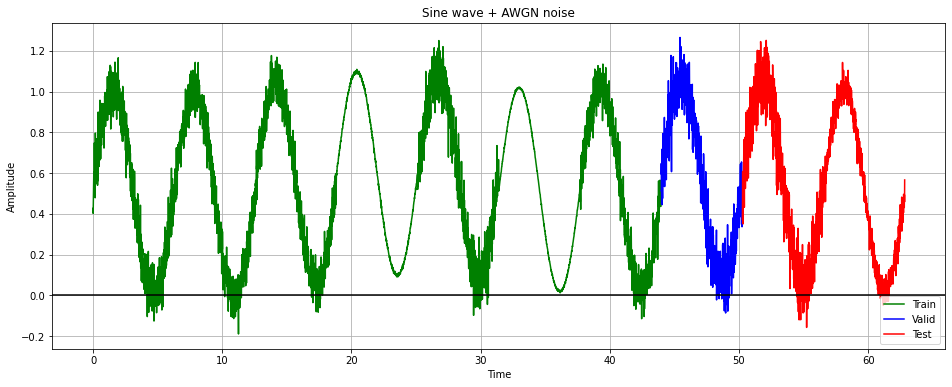

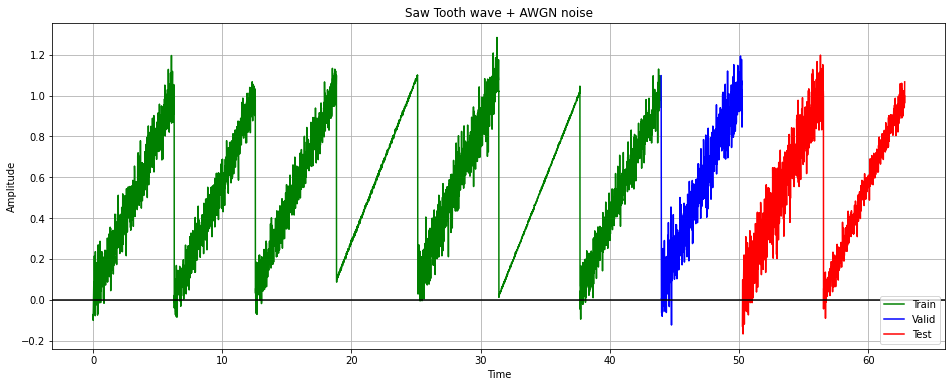

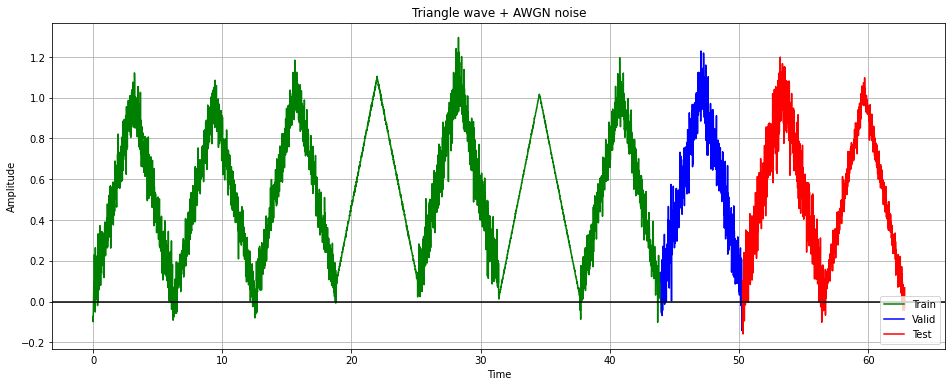

In [ ]:
noise_vecs = [np.random.normal(np.random.random()/10, np.random.random()/10, int(len(time)/10)) for i in range(10)]
noise_vecs.append(np.random.normal(np.random.random()/10, np.random.random()/10, len(time)-sum([n.shape[0] for n in noise_vecs])))
noise = np.concatenate(noise_vecs, axis=None)
# Noised Signals
sin_sig_noise = noise + sin_sig
saw_sig_noise = noise + saw_sig
tri_sig_noise = noise + tri_sig

sin_sigs_noise = [[time[ranges[i]], sin_sig_noise[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter(sin_sigs_noise, 'Sine wave + AWGN noise', 'Time', 'Amplitude', 'lower right')
saw_sigs_noise = [[time[ranges[i]], saw_sig_noise[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter(saw_sigs_noise, 'Saw Tooth wave + AWGN noise', 'Time', 'Amplitude', 'lower right')
tri_sigs_noise = [[time[ranges[i]], tri_sig_noise[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter(tri_sigs_noise, 'Triangle wave + AWGN noise', 'Time', 'Amplitude', 'lower right')


SimpleRNN model:

For LR == 0.001 :

For BATCH SIZE == 64 :


Training for Sine wave + AWGN noise in SimpleRNN model:

Epoch 1/10
68/68 [==============================] - 9s 86ms/step - loss: 0.0333 - val_loss: 0.0022
Epoch 2/10
68/68 [==============================] - 5s 75ms/step - loss: 0.0014 - val_loss: 5.8417e-04
Epoch 3/10
68/68 [==============================] - 5s 75ms/step - loss: 7.9133e-04 - val_loss: 4.8206e-04
Epoch 4/10
68/68 [==============================] - 5s 75ms/step - loss: 7.0454e-04 - val_loss: 3.1671e-04
Epoch 5/10
68/68 [==============================] - 5s 76ms/step - loss: 6.2873e-04 - val_loss: 1.6110e-04
Epoch 6/10
68/68 [==============================] - 5s 75ms/step - loss: 5.5084e-04 - val_loss: 1.5735e-04
Epoch 7/10
68/68 [==============================] - 5s 76ms/step - loss: 4.7844e-04 - val_loss: 1.6004e-04
Epoch 8/10
68/68 [==============================] - 5s 75ms/step - loss: 4.7719e-04 - val_loss: 3.1797e-04
Epoch 9/10
68/68 [==================

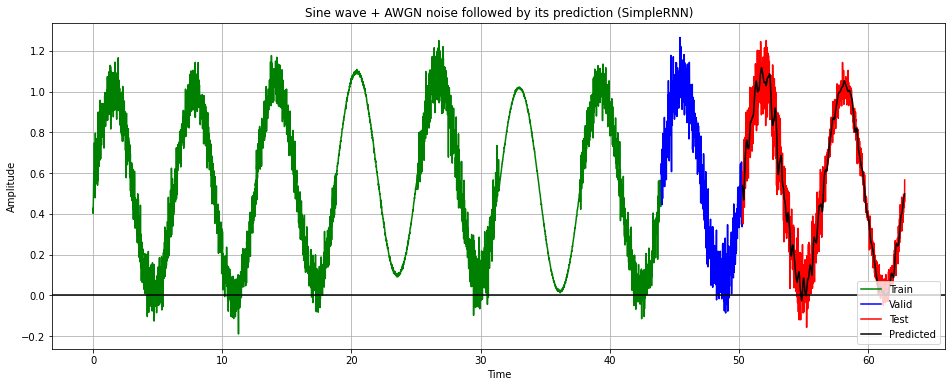


Root Mean Squared error: 0.05118056727686266.
SNR (dB): 22.02086453723862.

Plot the Loss curves


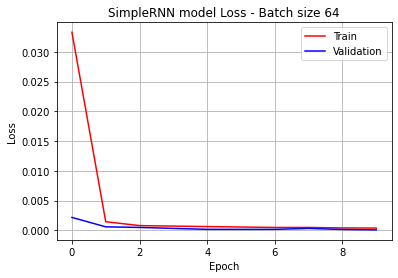


Training for Saw Tooth wave + AWGN noise in SimpleRNN model:

Epoch 1/10
68/68 [==============================] - 10s 94ms/step - loss: 0.0247 - val_loss: 0.0026
Epoch 2/10
68/68 [==============================] - 5s 77ms/step - loss: 0.0078 - val_loss: 6.9415e-04
Epoch 3/10
68/68 [==============================] - 5s 76ms/step - loss: 0.0059 - val_loss: 6.5581e-04
Epoch 4/10
68/68 [==============================] - 5s 77ms/step - loss: 0.0050 - val_loss: 4.8362e-04
Epoch 5/10
68/68 [==============================] - 5s 77ms/step - loss: 0.0045 - val_loss: 5.5947e-04
Epoch 6/10
68/68 [==============================] - 5s 77ms/step - loss: 0.0039 - val_loss: 6.4557e-04
Epoch 7/10
68/68 [==============================] - 5s 77ms/step - loss: 0.0038 - val_loss: 2.7776e-04
Epoch 8/10
68/68 [==============================] - 5s 78ms/step - loss: 0.0032 - val_loss: 2.8640e-04
Epoch 9/10
68/68 [==============================] - 5s 77ms/step - loss: 0.0034 - val_loss: 2.6082e-04
Epoch 10/10
6

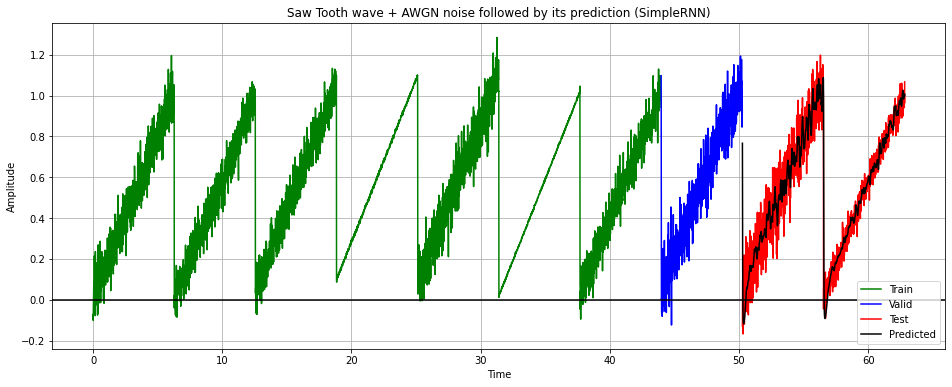


Root Mean Squared error: 0.06913567822572586.
SNR (dB): 18.962413011166127.

Plot the Loss curves


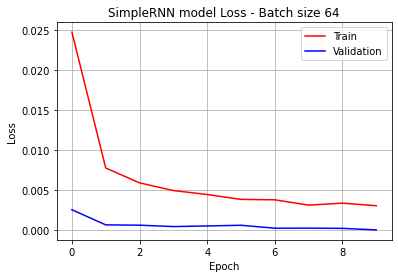


Training for Triangle wave + AWGN noise in SimpleRNN model:

Epoch 1/10
68/68 [==============================] - 9s 90ms/step - loss: 0.0214 - val_loss: 0.0014
Epoch 2/10
68/68 [==============================] - 5s 78ms/step - loss: 0.0012 - val_loss: 4.1423e-04
Epoch 3/10
68/68 [==============================] - 5s 79ms/step - loss: 7.2091e-04 - val_loss: 1.6817e-04
Epoch 4/10
68/68 [==============================] - 5s 79ms/step - loss: 5.7899e-04 - val_loss: 2.2215e-04
Epoch 5/10
68/68 [==============================] - 5s 78ms/step - loss: 4.8431e-04 - val_loss: 9.4317e-05
Epoch 6/10
68/68 [==============================] - 5s 77ms/step - loss: 4.4212e-04 - val_loss: 1.4006e-04
Epoch 7/10
68/68 [==============================] - 5s 77ms/step - loss: 4.2535e-04 - val_loss: 1.7320e-04
Epoch 8/10
68/68 [==============================] - 5s 78ms/step - loss: 3.9017e-04 - val_loss: 1.3567e-04
Epoch 9/10
68/68 [==============================] - 5s 78ms/step - loss: 4.2794e-04 - val_loss

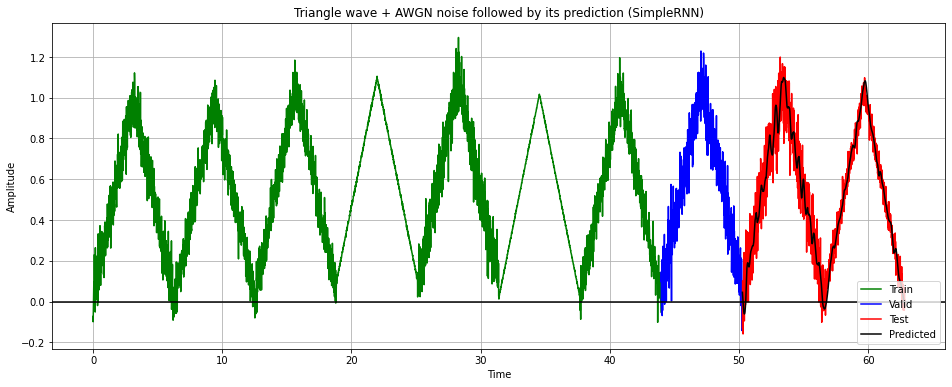


Root Mean Squared error: 0.054950320389548515.
SNR (dB): 21.00586717963018.

Plot the Loss curves


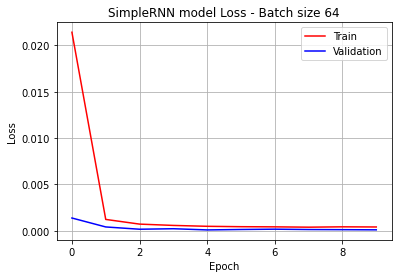

In [ ]:
window_size = 60
EPOCH_COUNT = 10
BATCH_SIZEs = [64]
LEARNING_RATEs = [0.001]
VAL_split = 0.125

models = ["SimpleRNN"]

signals = [sin_sig, saw_sig, tri_sig]
signals_noise = [sin_sig_noise, saw_sig_noise, tri_sig_noise]
signal_sets = [sin_sigs_noise, saw_sigs_noise, tri_sigs_noise]
signal_sets_lbls = ['Sine wave + AWGN noise', 'Saw Tooth wave + AWGN noise', 'Triangle wave + AWGN noise']

# Calculating RMSE
def rms_error(true_signal,predicted):
  return math.sqrt(mean_squared_error(true_signal, predicted))

# Calculating SNR
def snr_db(true_signal, received_signal):
  def power(x):
    return np.mean(x**2)
  noise = received_signal-true_signal
  SN_ratio = power(received_signal)/power(noise)
  return 10*math.log10(SN_ratio)

# plotting model performance
def model_plotter(model_history, metric, model_name, b_s):
  plt.figure()
  plt.plot(model_history.history[metric.lower()],'r')
  plt.plot(model_history.history['val_'+metric.lower()],'b')
  plt.title(model_name + ' model ' + metric.capitalize() + " - Batch size " + str(b_s))
  plt.ylabel(metric.capitalize())
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Validation'], loc='best')
  plt.grid()
  plt.savefig(model_name + "_" + metric.lower() + "_" + str(b_s) + ".png")
  plt.show()
for model_name in models:
  print("\n"+model_name, "model:\n")
  for LEARNING_RATE in LEARNING_RATEs:
    print("For LR ==", LEARNING_RATE,":\n")
    for BATCH_SIZE in BATCH_SIZEs:
      print("For BATCH SIZE ==", BATCH_SIZE,":\n")
      for index, s in enumerate(signals):
        print("\nTraining for", signal_sets_lbls[index], "in", model_name, "model:\n")
        sc = MinMaxScaler(feature_range=(0,1))
        scaled_signal = sc.fit_transform(s.reshape(-1, 1)).reshape(1, -1)[0]
        scaled_signal_noise = sc.fit_transform(signals_noise[index].reshape(-1, 1)).reshape(1, -1)[0]

        # Train Data
        X_train = []
        y_train = []
        for i in range(window_size, vl_range[-1]):
            X_train.append(scaled_signal[i-window_size:i])
            y_train.append(scaled_signal[i])
        X_train, y_train = np.array(X_train), np.array(y_train)
        X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1)) # E.g. (4338, 60) => (4338, 60, 1)
        # Test Data
        X_test = []
        inputs = scaled_signal_noise[len(time)-len(te_range) - window_size:]
        for i in range(window_size, len(inputs)+1):
            X_test.append(inputs[i-window_size:i])
        X_test = np.array(X_test)
        X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

        if model_name == "simpleRNN":
          # Creating the LSTM Model:
          model = Sequential()
          model.add(SimpleRNN(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
          model.add(Dropout(0.2))
          model.add(SimpleRNN(units=50))
          model.add(Dropout(0.2))
          model.add(Dense(units=1, activation='sigmoid'))
        else:
          # Creating the LSTM Model:
          model = Sequential()
          model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
          model.add(Dropout(0.2))
          model.add(LSTM(units=50))
          model.add(Dropout(0.2))
          model.add(Dense(units=1, activation='sigmoid'))

        # Compiling the LSTM
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE), loss='mse')

        # Fitting to the training set
        train_history = model.fit(X_train, y_train, epochs=EPOCH_COUNT, batch_size=BATCH_SIZE, validation_split=VAL_split)

        predicted_signal = model.predict(X_test)
        predicted_signal = np.delete(sc.inverse_transform(predicted_signal), [0])

        signal_sets[index] = [[time[ranges[i]], signals_noise[index][ranges[i]], colors[i], legends[i]] for i in range(3)]
        signal_sets[index].append([time[ranges[2]], predicted_signal, "k", "Predicted"])
        plotter(signal_sets[index], signal_sets_lbls[index]+' followed by its prediction ('+ model_name +')', 'Time', 'Amplitude', 'lower right')
        # Evaluating our model
        print("\nRoot Mean Squared error: {}.".format(rms_error(s[te_range], predicted_signal)))
        print("SNR (dB): {}.".format(snr_db(s[te_range], predicted_signal)))

        print("\nPlot the Loss curves")
        model_plotter(train_history, 'loss', model_name, BATCH_SIZE)

# PART F - 2d noise reduction:

Creating shapes:

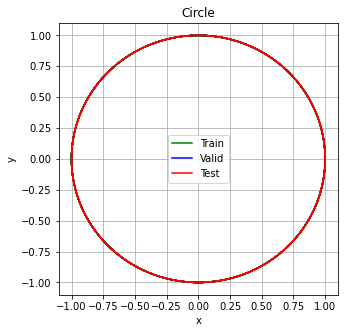

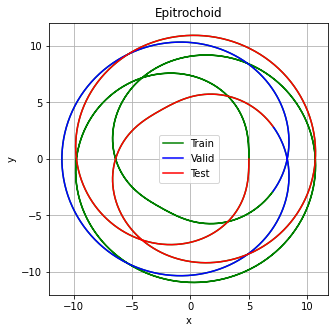

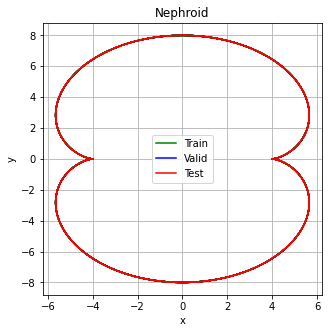

In [ ]:
import math
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt

import tensorflow as tf
from keras.layers import Input, Dense, LSTM, MaxPooling1D, Dropout, SimpleRNN, Flatten, TimeDistributed
from keras.models import Model, Sequential
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

Resolution = 0.01

# Plot waves
def plotter(signals, title, x_ax_lbl, y_ax_lbl, leg_loc="best"):
  plt.figure(figsize=(16, 6))
  for signal in signals:
    plt.plot(signal[0], signal[1], color=signal[2])
  plt.title(title)
  plt.xlabel(x_ax_lbl)
  plt.ylabel(y_ax_lbl)
  plt.legend([signals[i][3] for i in range(len(signals))], loc=leg_loc)
  plt.grid(True, which='both')
  plt.axhline(y=0, color="k")
  plt.show()

# Plot 2d shapes
def plotter_2d(signals, title, x_ax_lbl, y_ax_lbl, leg_loc="best"):
  plt.figure(figsize=(5, 5))
  for signal in signals:
    plt.plot(signal[0], signal[1], color=signal[2])
  plt.title(title)
  plt.xlabel(x_ax_lbl)
  plt.ylabel(y_ax_lbl)
  plt.legend([signals[i][3] for i in range(len(signals))], loc=leg_loc)
  plt.grid(True, which='both')
  plt.show()

# Get x values of the sine wave
time = np.arange(0, 10*2*np.pi, Resolution)
# Create range for train, valid and test parts
tr_range = range(0,int(len(time)* 0.7))
vl_range = range(int(len(time)* 0.7), int(len(time)* 0.8))
te_range = range(int(len(time)* 0.8), len(time))
ranges = [tr_range, vl_range, te_range]
colors = ["g", "b", "r"]
legends = ["Train", "Valid", "Test"]
# Signals
cir_x_sig = np.cos(time)
cir_y_sig = np.sin(time)
a, b, c = 3, 5, 3
epi_x_sig = (a+b)*np.cos(time)-c*np.cos((1+a/b)*time)
epi_y_sig = (a+b)*np.sin(time)-c*np.sin((1+a/b)*time)
a = 2
nep_x_sig = a*(np.cos(3*time)-3*np.cos(time))
nep_y_sig = a*(np.sin(3*time)-3*np.sin(time))

cir_sigs = [[cir_x_sig[ranges[i]], cir_y_sig[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter_2d(cir_sigs, 'Circle', 'x', 'y')
epi_sigs = [[epi_x_sig[ranges[i]], epi_y_sig[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter_2d(epi_sigs, 'Epitrochoid', 'x', 'y')
nep_sigs = [[nep_x_sig[ranges[i]], nep_y_sig[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter_2d(nep_sigs, 'Nephroid', 'x', 'y')

Adding noise:

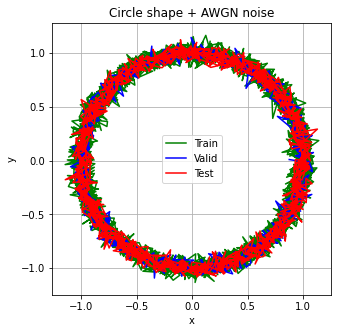

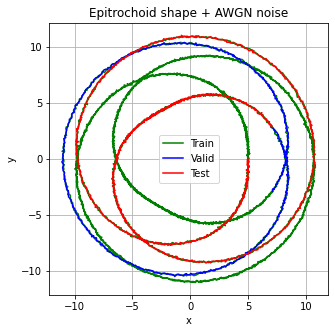

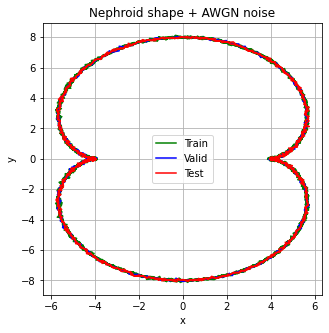

In [ ]:
sigma = 0.05

noise_x = np.random.normal(0, sigma, len(time))
noise_y = np.random.normal(0, sigma, len(time))
# Noised Signals
cir_x_sig_noise = noise_x + cir_x_sig
cir_y_sig_noise = noise_y + cir_y_sig
epi_x_sig_noise = noise_x + epi_x_sig
epi_y_sig_noise = noise_y + epi_y_sig
nep_x_sig_noise = noise_x + nep_x_sig
nep_y_sig_noise = noise_y + nep_y_sig

cir_sigs_noise = [[cir_x_sig_noise[ranges[i]], cir_y_sig_noise[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter_2d(cir_sigs_noise, 'Circle shape + AWGN noise', 'x', 'y')
epi_sigs_noise = [[epi_x_sig_noise[ranges[i]], epi_y_sig_noise[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter_2d(epi_sigs_noise, 'Epitrochoid shape + AWGN noise', 'x', 'y')
nep_sigs_noise = [[nep_x_sig_noise[ranges[i]], nep_y_sig_noise[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter_2d(nep_sigs_noise, 'Nephroid shape + AWGN noise', 'x', 'y')

functions:

In [ ]:
# Calculating RMSE
def rms_error(true_signal,predicted):
  return math.sqrt(mean_squared_error(true_signal, predicted))

# Calculating SNR
def snr_db(true_signal, received_signal):
  def power(x):
    return np.mean(x**2)
  noise = received_signal-true_signal
  SN_ratio = power(received_signal)/power(noise)
  return 10*math.log10(SN_ratio)

# plotting model performance
def model_plotter(model_history, metric, model_name, b_s):
  plt.figure()
  plt.plot(model_history.history[metric.lower()],'r')
  plt.plot(model_history.history['val_'+metric.lower()],'b')
  plt.title(model_name + ' model ' + metric.capitalize() + " - Batch size " + str(b_s))
  plt.ylabel(metric.capitalize())
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Validation'], loc='best')
  plt.grid()
  plt.savefig(model_name + "_" + metric.lower() + "_" + str(b_s) + ".png")
  plt.show()

# Creating, Processing, Learning, Predicting, Plotting and whatever...
def main_process_2d(models, LEARNING_RATEs, BATCH_SIZEs, signals, signals_noise, signal_sets_lbls):
  for model_name in models:
    print("\n\n"+model_name, "model:", "\n")
    for LEARNING_RATE in LEARNING_RATEs:
      print("For learning rate ==", LEARNING_RATE,":\n")
      for BATCH_SIZE in BATCH_SIZEs:
        print("For BATCH SIZE ==", BATCH_SIZE,":\n")
        for index, s in enumerate(signals):
          print("\nTraining for", signal_sets_lbls[index], ":\n")
          prediction_2d = []
          lbl = ["x", "y"]
          for k in range(2):
            print("\nProcess for", lbl[k], "\n")
            sc = MinMaxScaler(feature_range=(0,1))
            scaled_signal = sc.fit_transform(s[k].reshape(-1, 1)).reshape(1, -1)[0]
            # scaled_signal = s[k]
            scaled_signal_noise = sc.fit_transform(signals_noise[index][k].reshape(-1, 1)).reshape(1, -1)[0]
            # scaled_signal_noise = signals_noise[index][k]

            # Train Data
            X_train = []
            y_train = []
            for i in range(window_size, vl_range[-1]):
                X_train.append(scaled_signal[i-window_size:i])
                y_train.append(scaled_signal[i])
            X_train, y_train = np.array(X_train), np.array(y_train)
            X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1)) # E.g. (4338, 60) => (4338, 60, 1)
            # Test Data
            X_test = []
            inputs = scaled_signal_noise[len(time)-len(te_range) - window_size:]
            for i in range(window_size, len(inputs)+1):
                X_test.append(inputs[i-window_size:i])
            X_test = np.array(X_test)
            X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

            if model_name == "simpleRNN":
              # Creating the LSTM Model:
              model = Sequential()
              model.add(SimpleRNN(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
              model.add(Dropout(0.2))
              model.add(SimpleRNN(units=50))
              model.add(Dropout(0.2))
              model.add(Dense(units=1, activation='sigmoid'))
            else:
              # Creating the LSTM Model:
              model = Sequential()
              model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
              model.add(Dropout(0.2))
              model.add(LSTM(units=50))
              model.add(Dropout(0.2))
              model.add(Dense(units=1, activation='sigmoid'))

            # Compiling the LSTM
            model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE), loss='mse')

            # Fitting to the training set
            train_history = model.fit(X_train, y_train, epochs=EPOCH_COUNT, batch_size=BATCH_SIZE, validation_split=VAL_split)

            predicted_signal = model.predict(X_test)
            predicted_signal = np.delete(sc.inverse_transform(predicted_signal), [0])

            # Evaluating our model
            print("\nRoot Mean Squared error: {}.".format(rms_error(s[k][te_range], predicted_signal)))
            print("SNR (dB): {}.".format(snr_db(s[k][te_range], predicted_signal)))

            print("\nPlot the Loss curves")
            model_plotter(train_history, 'loss', model_name, BATCH_SIZE)
            prediction_2d.append(predicted_signal)
          # Plot the final results
          signal_sets = [[signals_noise[index][0][ranges[i]], signals_noise[index][1][ranges[i]], colors[i], legends[i]] for i in range(3)]
          signal_sets.append([prediction_2d[0], prediction_2d[1], "k", "Predicted"])
          plotter_2d(signal_sets, signal_sets_lbls[index]+' followed by its prediction ('+ model_name +')', 'x', 'y')

Let's do it:



SimpleRNN model: 

For learning rate == 0.01 :

For BATCH SIZE == 64 :


Training for Sine wave + AWGN noise :

Process for x 

Epoch 1/5
68/68 [==============================] - 7s 44ms/step - loss: 0.0068 - val_loss: 3.3745e-04
Epoch 2/5
68/68 [==============================] - 2s 31ms/step - loss: 5.1028e-04 - val_loss: 1.1347e-04
Epoch 3/5
68/68 [==============================] - 2s 31ms/step - loss: 6.1041e-04 - val_loss: 1.3667e-04
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 3.6873e-04 - val_loss: 7.0732e-05
Epoch 5/5
68/68 [==============================] - 2s 31ms/step - loss: 3.6830e-04 - val_loss: 5.1726e-04

Root Mean Squared error: 1.0425015891570955.
SNR (dB): -2.6664878356471995.

Plot the Loss curves


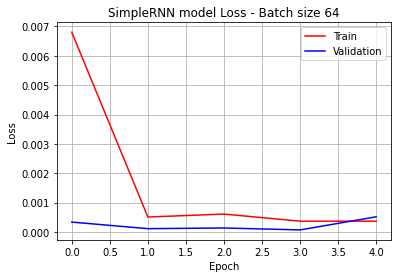

Process for y 

Epoch 1/5
68/68 [==============================] - 7s 44ms/step - loss: 0.0087 - val_loss: 1.6117e-04
Epoch 2/5
68/68 [==============================] - 2s 30ms/step - loss: 6.4136e-04 - val_loss: 2.7285e-04
Epoch 3/5
68/68 [==============================] - 2s 31ms/step - loss: 5.5424e-04 - val_loss: 9.1429e-05
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 4.5322e-04 - val_loss: 6.3134e-05
Epoch 5/5
68/68 [==============================] - 2s 31ms/step - loss: 4.4261e-04 - val_loss: 1.4977e-04

Root Mean Squared error: 0.992864081242151.
SNR (dB): -3.011744626117807.

Plot the Loss curves


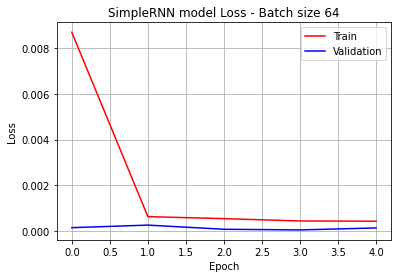

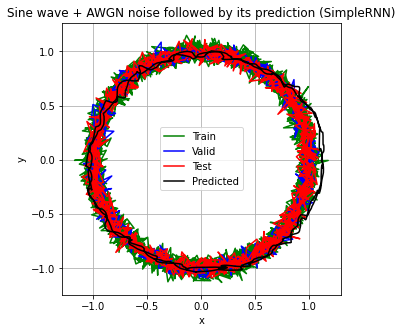


Training for Saw Tooth wave + AWGN noise :

Process for x 

Epoch 1/5
68/68 [==============================] - 7s 45ms/step - loss: 0.0059 - val_loss: 4.1832e-04
Epoch 2/5
68/68 [==============================] - 2s 31ms/step - loss: 7.8414e-04 - val_loss: 1.1269e-04
Epoch 3/5
68/68 [==============================] - 2s 31ms/step - loss: 4.6864e-04 - val_loss: 2.0400e-04
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 4.8834e-04 - val_loss: 2.4472e-04
Epoch 5/5
68/68 [==============================] - 2s 31ms/step - loss: 5.0870e-04 - val_loss: 1.1761e-04

Root Mean Squared error: 0.10953389525973639.
SNR (dB): 34.46865129541112.

Plot the Loss curves


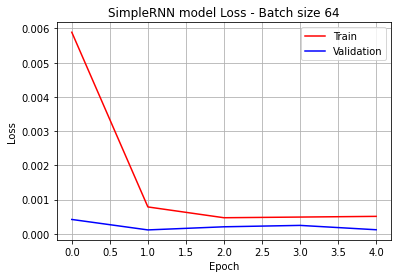

Process for y 

Epoch 1/5
68/68 [==============================] - 7s 44ms/step - loss: 0.0097 - val_loss: 4.2202e-04
Epoch 2/5
68/68 [==============================] - 2s 31ms/step - loss: 5.5614e-04 - val_loss: 1.1470e-04
Epoch 3/5
68/68 [==============================] - 2s 31ms/step - loss: 4.0645e-04 - val_loss: 3.3282e-04
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 3.8115e-04 - val_loss: 1.5541e-04
Epoch 5/5
68/68 [==============================] - 2s 32ms/step - loss: 3.8513e-04 - val_loss: 1.1419e-04

Root Mean Squared error: 0.22044999727597953.
SNR (dB): 28.246467918934076.

Plot the Loss curves


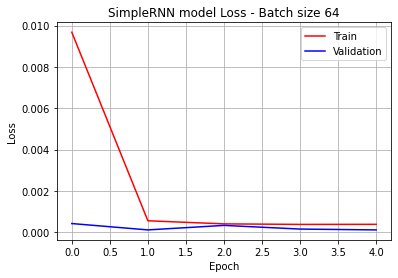

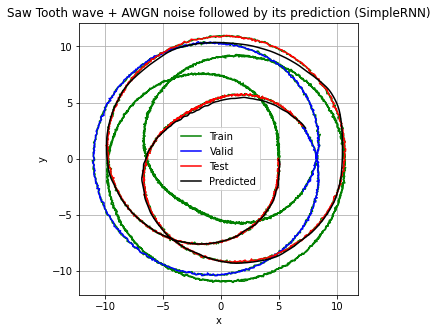


Training for Triangle wave + AWGN noise :

Process for x 

Epoch 1/5
68/68 [==============================] - 7s 45ms/step - loss: 0.0099 - val_loss: 3.6608e-04
Epoch 2/5
68/68 [==============================] - 2s 31ms/step - loss: 6.1870e-04 - val_loss: 2.1095e-04
Epoch 3/5
68/68 [==============================] - 2s 31ms/step - loss: 6.0887e-04 - val_loss: 5.3471e-04
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 4.5446e-04 - val_loss: 3.8170e-04
Epoch 5/5
68/68 [==============================] - 2s 31ms/step - loss: 5.6332e-04 - val_loss: 7.3275e-05

Root Mean Squared error: 0.10752649221043058.
SNR (dB): 32.531086037276424.

Plot the Loss curves


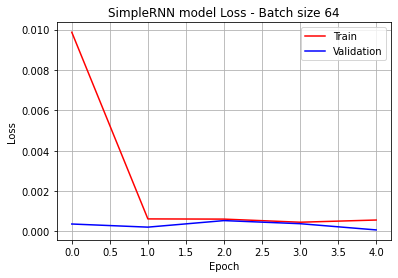

Process for y 

Epoch 1/5
68/68 [==============================] - 7s 45ms/step - loss: 0.0098 - val_loss: 1.8833e-04
Epoch 2/5
68/68 [==============================] - 2s 32ms/step - loss: 4.7325e-04 - val_loss: 1.2414e-04
Epoch 3/5
68/68 [==============================] - 2s 31ms/step - loss: 3.1390e-04 - val_loss: 6.7018e-05
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 4.3528e-04 - val_loss: 6.9737e-05
Epoch 5/5
68/68 [==============================] - 2s 31ms/step - loss: 2.6976e-04 - val_loss: 4.1470e-05

Root Mean Squared error: 0.11294034221286106.
SNR (dB): 31.974879349217282.

Plot the Loss curves


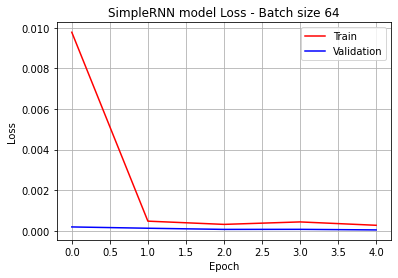

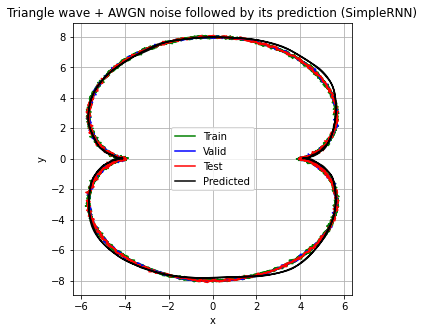



LSTM model: 

For learning rate == 0.01 :

For BATCH SIZE == 64 :


Training for Sine wave + AWGN noise :

Process for x 

Epoch 1/5
68/68 [==============================] - 7s 52ms/step - loss: 0.0083 - val_loss: 3.8786e-04
Epoch 2/5
68/68 [==============================] - 2s 31ms/step - loss: 6.0754e-04 - val_loss: 1.0308e-04
Epoch 3/5
68/68 [==============================] - 2s 32ms/step - loss: 4.3027e-04 - val_loss: 5.2821e-04
Epoch 4/5
68/68 [==============================] - 2s 32ms/step - loss: 4.8937e-04 - val_loss: 8.0777e-05
Epoch 5/5
68/68 [==============================] - 2s 32ms/step - loss: 3.6216e-04 - val_loss: 7.2547e-05

Root Mean Squared error: 1.021671601549119.
SNR (dB): -2.877550782397349.

Plot the Loss curves


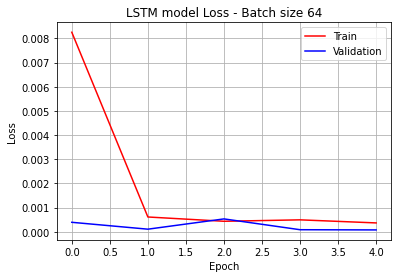

Process for y 

Epoch 1/5
68/68 [==============================] - 6s 45ms/step - loss: 0.0111 - val_loss: 3.3011e-04
Epoch 2/5
68/68 [==============================] - 2s 31ms/step - loss: 6.3268e-04 - val_loss: 1.0715e-04
Epoch 3/5
68/68 [==============================] - 2s 32ms/step - loss: 4.2406e-04 - val_loss: 1.1896e-04
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 4.9126e-04 - val_loss: 2.6813e-04
Epoch 5/5
68/68 [==============================] - 2s 32ms/step - loss: 2.9971e-04 - val_loss: 1.8195e-04

Root Mean Squared error: 1.0259524084139413.
SNR (dB): -2.816863868888395.

Plot the Loss curves


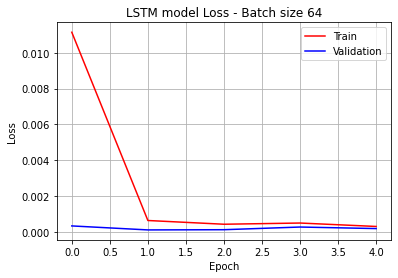

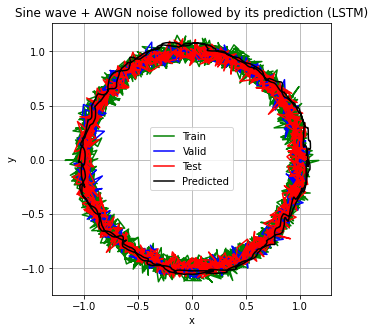


Training for Saw Tooth wave + AWGN noise :

Process for x 

Epoch 1/5
68/68 [==============================] - 7s 44ms/step - loss: 0.0064 - val_loss: 2.7597e-04
Epoch 2/5
68/68 [==============================] - 2s 32ms/step - loss: 5.2526e-04 - val_loss: 2.4426e-04
Epoch 3/5
68/68 [==============================] - 2s 32ms/step - loss: 4.5776e-04 - val_loss: 1.7431e-04
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 5.0270e-04 - val_loss: 2.4545e-04
Epoch 5/5
68/68 [==============================] - 2s 32ms/step - loss: 3.5023e-04 - val_loss: 1.1008e-04

Root Mean Squared error: 0.1778127297984464.
SNR (dB): 30.039630978274083.

Plot the Loss curves


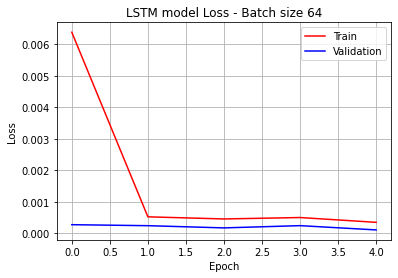

Process for y 

Epoch 1/5
68/68 [==============================] - 7s 50ms/step - loss: 0.0065 - val_loss: 2.4731e-04
Epoch 2/5
68/68 [==============================] - 2s 32ms/step - loss: 6.1696e-04 - val_loss: 1.2377e-04
Epoch 3/5
68/68 [==============================] - 2s 32ms/step - loss: 5.1814e-04 - val_loss: 5.9635e-04
Epoch 4/5
68/68 [==============================] - 2s 32ms/step - loss: 4.9319e-04 - val_loss: 8.8570e-05
Epoch 5/5
68/68 [==============================] - 2s 32ms/step - loss: 3.6326e-04 - val_loss: 8.5058e-05

Root Mean Squared error: 0.19964159942331783.
SNR (dB): 29.21323498469873.

Plot the Loss curves


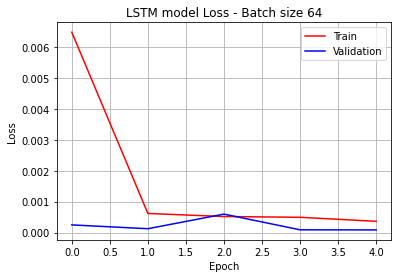

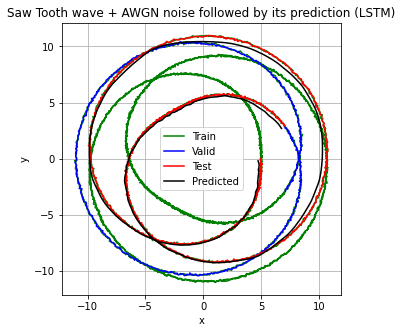


Training for Triangle wave + AWGN noise :

Process for x 

Epoch 1/5
68/68 [==============================] - 7s 45ms/step - loss: 0.0115 - val_loss: 0.0011
Epoch 2/5
68/68 [==============================] - 2s 32ms/step - loss: 8.2551e-04 - val_loss: 4.5165e-04
Epoch 3/5
68/68 [==============================] - 2s 32ms/step - loss: 7.4695e-04 - val_loss: 3.0137e-04
Epoch 4/5
68/68 [==============================] - 2s 32ms/step - loss: 0.0015 - val_loss: 0.0017
Epoch 5/5
68/68 [==============================] - 2s 32ms/step - loss: 7.0785e-04 - val_loss: 7.8228e-05

Root Mean Squared error: 0.09251464489506232.
SNR (dB): 33.71724597621486.

Plot the Loss curves


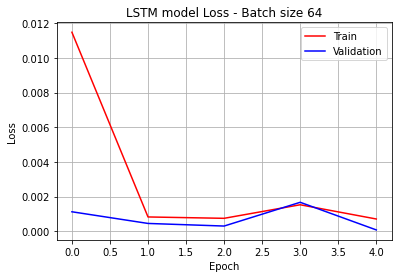

Process for y 

Epoch 1/5
68/68 [==============================] - 7s 46ms/step - loss: 0.0089 - val_loss: 2.4130e-04
Epoch 2/5
68/68 [==============================] - 2s 32ms/step - loss: 4.8470e-04 - val_loss: 1.4753e-04
Epoch 3/5
68/68 [==============================] - 2s 32ms/step - loss: 4.4231e-04 - val_loss: 2.5359e-04
Epoch 4/5
68/68 [==============================] - 2s 32ms/step - loss: 3.5406e-04 - val_loss: 5.9088e-05
Epoch 5/5
68/68 [==============================] - 2s 32ms/step - loss: 3.0948e-04 - val_loss: 2.7600e-04

Root Mean Squared error: 0.2599208610534496.
SNR (dB): 24.353652115128934.

Plot the Loss curves


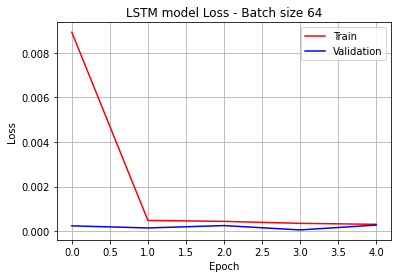

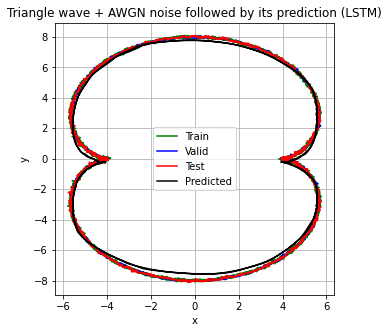

In [ ]:
window_size = 60
EPOCH_COUNT = 5
BATCH_SIZEs = [64]
LEARNING_RATEs = [0.01]
VAL_split = 0.125

models = ["SimpleRNN", "LSTM"]

signals = [[cir_x_sig, cir_y_sig], [epi_x_sig, epi_y_sig], [nep_x_sig, nep_y_sig]]
signals_noise = [[cir_x_sig_noise, cir_y_sig_noise], [epi_x_sig_noise, epi_y_sig_noise], [nep_x_sig_noise, nep_y_sig_noise]]
signal_sets_lbls = ['Sine wave + AWGN noise', 'Saw Tooth wave + AWGN noise', 'Triangle wave + AWGN noise']

main_process_2d(models, LEARNING_RATEs, BATCH_SIZEs, signals, signals_noise, signal_sets_lbls)



LSTM model: 

For learning rate == 0.01 :

For BATCH SIZE == 8 :


Training for Sine wave + AWGN noise :


Process for x 

Epoch 1/5
544/544 [==============================] - 23s 30ms/step - loss: 0.0031 - val_loss: 1.6115e-04
Epoch 2/5
544/544 [==============================] - 15s 28ms/step - loss: 7.1282e-04 - val_loss: 1.9452e-04
Epoch 3/5
544/544 [==============================] - 15s 28ms/step - loss: 5.6112e-04 - val_loss: 4.7784e-04
Epoch 4/5
544/544 [==============================] - 15s 28ms/step - loss: 6.3038e-04 - val_loss: 7.1090e-04
Epoch 5/5
544/544 [==============================] - 15s 28ms/step - loss: 4.6497e-04 - val_loss: 7.7646e-05

Root Mean Squared error: 0.0474839735355429.
SNR (dB): 23.464310537034258.

Plot the Loss curves


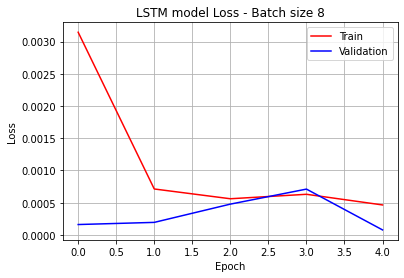


Process for y 

Epoch 1/5
544/544 [==============================] - 20s 30ms/step - loss: 0.0045 - val_loss: 7.0894e-04
Epoch 2/5
544/544 [==============================] - 15s 28ms/step - loss: 7.3393e-04 - val_loss: 2.5228e-04
Epoch 3/5
544/544 [==============================] - 15s 28ms/step - loss: 5.5072e-04 - val_loss: 4.7711e-04
Epoch 4/5
544/544 [==============================] - 15s 28ms/step - loss: 8.8038e-04 - val_loss: 6.2043e-04
Epoch 5/5
544/544 [==============================] - 15s 28ms/step - loss: 4.1069e-04 - val_loss: 6.8102e-05

Root Mean Squared error: 0.03130343629313143.
SNR (dB): 27.086601447077072.

Plot the Loss curves


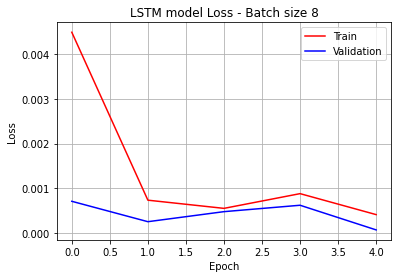

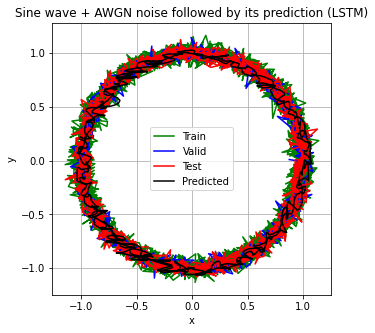

For BATCH SIZE == 64 :


Training for Sine wave + AWGN noise :


Process for x 

Epoch 1/5
68/68 [==============================] - 7s 49ms/step - loss: 0.0092 - val_loss: 2.6949e-04
Epoch 2/5
68/68 [==============================] - 2s 31ms/step - loss: 6.0342e-04 - val_loss: 2.9925e-04
Epoch 3/5
68/68 [==============================] - 2s 30ms/step - loss: 5.3879e-04 - val_loss: 1.9739e-04
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 3.9073e-04 - val_loss: 9.5463e-05
Epoch 5/5
68/68 [==============================] - 2s 31ms/step - loss: 3.7651e-04 - val_loss: 0.0011

Root Mean Squared error: 0.0982077425474365.
SNR (dB): 18.06452562477351.

Plot the Loss curves


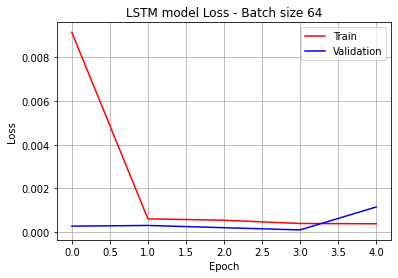


Process for y 

Epoch 1/5
68/68 [==============================] - 7s 44ms/step - loss: 0.0119 - val_loss: 2.8022e-04
Epoch 2/5
68/68 [==============================] - 2s 30ms/step - loss: 6.6601e-04 - val_loss: 1.4113e-04
Epoch 3/5
68/68 [==============================] - 2s 30ms/step - loss: 5.2609e-04 - val_loss: 2.3376e-04
Epoch 4/5
68/68 [==============================] - 2s 30ms/step - loss: 3.8160e-04 - val_loss: 7.7311e-05
Epoch 5/5
68/68 [==============================] - 2s 31ms/step - loss: 4.1889e-04 - val_loss: 9.2598e-05

Root Mean Squared error: 0.028965467998698875.
SNR (dB): 27.796954005430727.

Plot the Loss curves


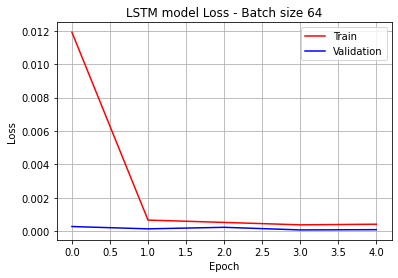

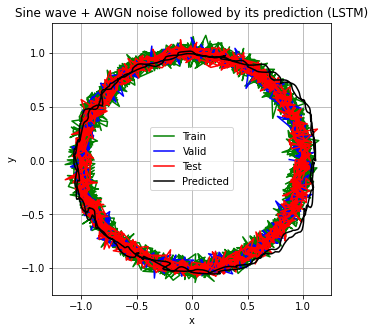

For BATCH SIZE == 256 :


Training for Sine wave + AWGN noise :


Process for x 

Epoch 1/5
17/17 [==============================] - 6s 97ms/step - loss: 0.0285 - val_loss: 0.0035
Epoch 2/5
17/17 [==============================] - 1s 37ms/step - loss: 0.0030 - val_loss: 7.3625e-04
Epoch 3/5
17/17 [==============================] - 1s 38ms/step - loss: 0.0011 - val_loss: 3.0607e-04
Epoch 4/5
17/17 [==============================] - 1s 37ms/step - loss: 6.8563e-04 - val_loss: 2.6698e-04
Epoch 5/5
17/17 [==============================] - 1s 38ms/step - loss: 5.6741e-04 - val_loss: 1.3772e-04

Root Mean Squared error: 0.03554619285985429.
SNR (dB): 26.217777128443444.

Plot the Loss curves


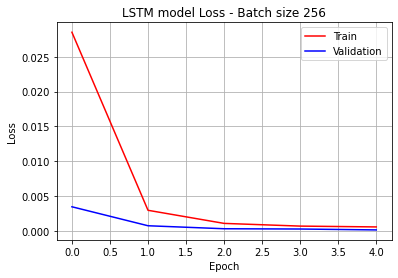


Process for y 

Epoch 1/5
17/17 [==============================] - 5s 115ms/step - loss: 0.0267 - val_loss: 0.0037
Epoch 2/5
17/17 [==============================] - 1s 38ms/step - loss: 0.0031 - val_loss: 0.0016
Epoch 3/5
17/17 [==============================] - 1s 37ms/step - loss: 0.0011 - val_loss: 3.1294e-04
Epoch 4/5
17/17 [==============================] - 1s 36ms/step - loss: 7.2698e-04 - val_loss: 1.5716e-04
Epoch 5/5
17/17 [==============================] - 1s 37ms/step - loss: 5.1762e-04 - val_loss: 1.3441e-04

Root Mean Squared error: 0.03446129873772017.
SNR (dB): 26.542742331877264.

Plot the Loss curves


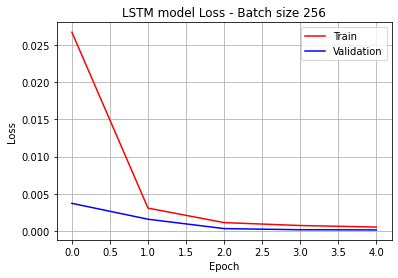

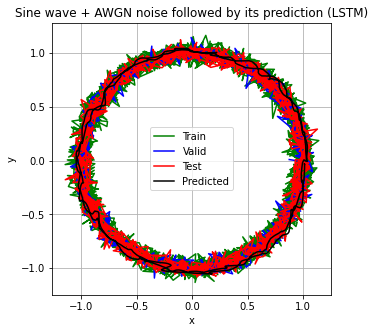

In [ ]:
window_size = 60
EPOCH_COUNT = 5
BATCH_SIZEs = [8, 64, 256]
LEARNING_RATEs = [0.01]
VAL_split = 0.125

models = ["LSTM"]

signals = [[cir_x_sig, cir_y_sig],]
signals_noise = [[cir_x_sig_noise, cir_y_sig_noise],]
signal_sets_lbls = ['Sine wave + AWGN noise',]

main_process_2d(models, LEARNING_RATEs, BATCH_SIZEs, signals, signals_noise, signal_sets_lbls)



LSTM model: 

For learning rate == 0.0001 :

For BATCH SIZE == 64 :


Training for Sine wave + AWGN noise :


Process for x 

Epoch 1/5
68/68 [==============================] - 7s 44ms/step - loss: 0.1084 - val_loss: 0.0835
Epoch 2/5
68/68 [==============================] - 2s 30ms/step - loss: 0.0556 - val_loss: 0.0234
Epoch 3/5
68/68 [==============================] - 2s 30ms/step - loss: 0.0156 - val_loss: 0.0109
Epoch 4/5
68/68 [==============================] - 2s 30ms/step - loss: 0.0097 - val_loss: 0.0072
Epoch 5/5
68/68 [==============================] - 2s 30ms/step - loss: 0.0058 - val_loss: 0.0032

Root Mean Squared error: 0.08952773570916264.
SNR (dB): 17.636493563858924.

Plot the Loss curves


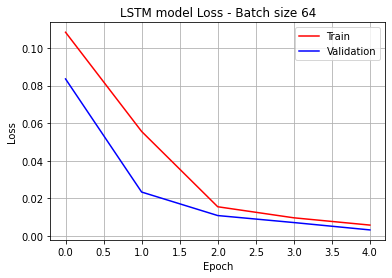


Process for y 

Epoch 1/5
68/68 [==============================] - 7s 44ms/step - loss: 0.1189 - val_loss: 0.0948
Epoch 2/5
68/68 [==============================] - 2s 30ms/step - loss: 0.0696 - val_loss: 0.0439
Epoch 3/5
68/68 [==============================] - 2s 31ms/step - loss: 0.0230 - val_loss: 0.0125
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 0.0112 - val_loss: 0.0086
Epoch 5/5
68/68 [==============================] - 2s 30ms/step - loss: 0.0080 - val_loss: 0.0061

Root Mean Squared error: 0.13872076717827517.
SNR (dB): 14.053968947008803.

Plot the Loss curves


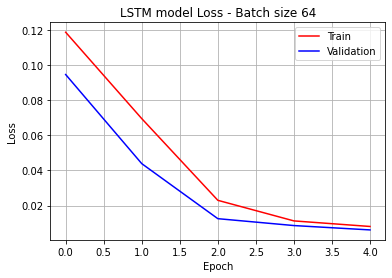

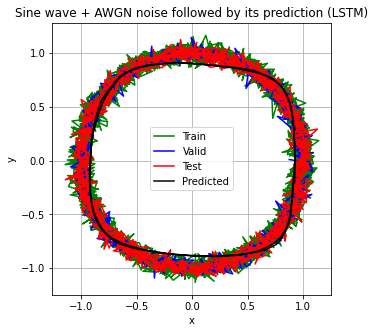

For learning rate == 0.001 :

For BATCH SIZE == 64 :


Training for Sine wave + AWGN noise :


Process for x 

Epoch 1/5
68/68 [==============================] - 7s 45ms/step - loss: 0.0338 - val_loss: 0.0025
Epoch 2/5
68/68 [==============================] - 2s 31ms/step - loss: 0.0015 - val_loss: 5.8971e-04
Epoch 3/5
68/68 [==============================] - 2s 31ms/step - loss: 8.8464e-04 - val_loss: 5.9588e-04
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 6.8606e-04 - val_loss: 2.9645e-04
Epoch 5/5
68/68 [==============================] - 2s 31ms/step - loss: 5.6224e-04 - val_loss: 1.3591e-04

Root Mean Squared error: 0.0295339351611595.
SNR (dB): 27.75977884024154.

Plot the Loss curves


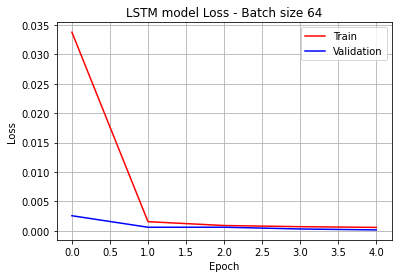


Process for y 

Epoch 1/5
68/68 [==============================] - 7s 45ms/step - loss: 0.0358 - val_loss: 0.0019
Epoch 2/5
68/68 [==============================] - 2s 31ms/step - loss: 0.0014 - val_loss: 5.5378e-04
Epoch 3/5
68/68 [==============================] - 2s 31ms/step - loss: 7.6433e-04 - val_loss: 2.9025e-04
Epoch 4/5
68/68 [==============================] - 2s 32ms/step - loss: 6.4209e-04 - val_loss: 4.4249e-04
Epoch 5/5
68/68 [==============================] - 2s 31ms/step - loss: 5.2240e-04 - val_loss: 8.6202e-04

Root Mean Squared error: 0.08499925285954092.
SNR (dB): 19.262049803062176.

Plot the Loss curves


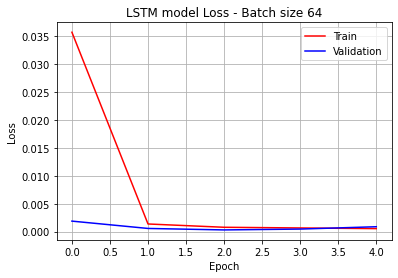

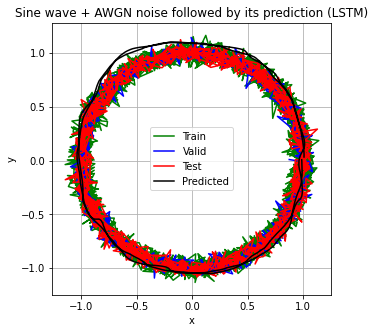

For learning rate == 0.01 :

For BATCH SIZE == 64 :


Training for Sine wave + AWGN noise :


Process for x 

Epoch 1/5
68/68 [==============================] - 7s 44ms/step - loss: 0.0101 - val_loss: 6.6406e-04
Epoch 2/5
68/68 [==============================] - 2s 31ms/step - loss: 6.7743e-04 - val_loss: 1.4463e-04
Epoch 3/5
68/68 [==============================] - 2s 31ms/step - loss: 4.7890e-04 - val_loss: 4.1520e-04
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 7.0791e-04 - val_loss: 3.9489e-04
Epoch 5/5
68/68 [==============================] - 2s 31ms/step - loss: 5.4139e-04 - val_loss: 1.6323e-04

Root Mean Squared error: 0.034710236604738404.
SNR (dB): 26.30443582818338.

Plot the Loss curves


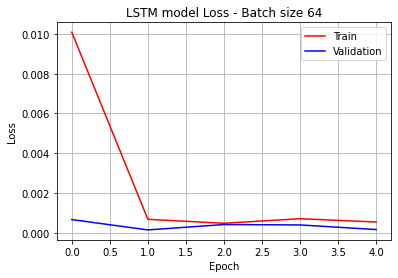


Process for y 

Epoch 1/5
68/68 [==============================] - 7s 45ms/step - loss: 0.0109 - val_loss: 4.8299e-04
Epoch 2/5
68/68 [==============================] - 2s 31ms/step - loss: 5.6203e-04 - val_loss: 2.0880e-04
Epoch 3/5
68/68 [==============================] - 2s 31ms/step - loss: 4.6048e-04 - val_loss: 1.1046e-04
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 3.8591e-04 - val_loss: 2.9265e-04
Epoch 5/5
68/68 [==============================] - 2s 30ms/step - loss: 3.7281e-04 - val_loss: 3.0707e-05

Root Mean Squared error: 0.0279732070010763.
SNR (dB): 28.16047782903908.

Plot the Loss curves


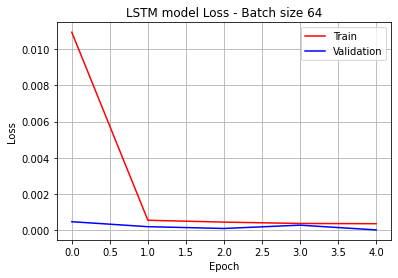

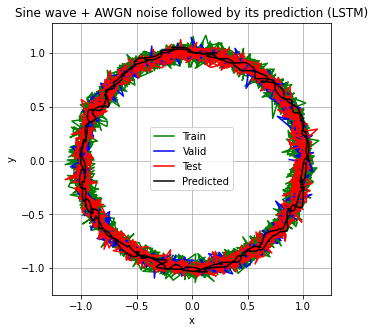

In [ ]:
window_size = 60
EPOCH_COUNT = 5
BATCH_SIZEs = [64,]
LEARNING_RATEs = [0.0001, 0.001, 0.01]
VAL_split = 0.125

models = ["LSTM"]

signals = [[cir_x_sig, cir_y_sig],]
signals_noise = [[cir_x_sig_noise, cir_y_sig_noise],]
signal_sets_lbls = ['Sine wave + AWGN noise',]

main_process_2d(models, LEARNING_RATEs, BATCH_SIZEs, signals, signals_noise, signal_sets_lbls)

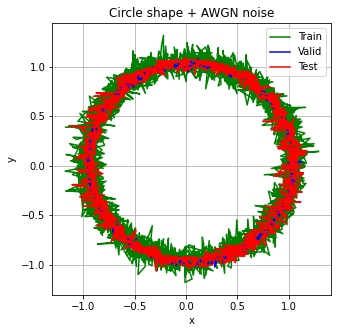

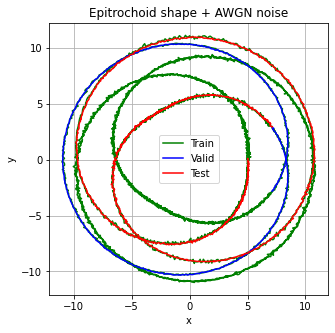

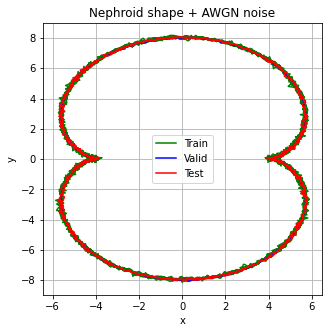

In [ ]:
noise_vecs = [np.random.normal(np.random.random()/10, np.random.random()/10, int(len(time)/10)) for i in range(10)]
noise_vecs.append(np.random.normal(np.random.random()/10, np.random.random()/10, len(time)-sum([n.shape[0] for n in noise_vecs])))
noise_x = np.concatenate(noise_vecs, axis=None)

noise_vecs = [np.random.normal(np.random.random()/10, np.random.random()/10, int(len(time)/10)) for i in range(10)]
noise_vecs.append(np.random.normal(np.random.random()/10, np.random.random()/10, len(time)-sum([n.shape[0] for n in noise_vecs])))
noise_y = np.concatenate(noise_vecs, axis=None)
# Noised Signals
cir_x_sig_noise = noise_x + cir_x_sig
cir_y_sig_noise = noise_y + cir_y_sig
epi_x_sig_noise = noise_x + epi_x_sig
epi_y_sig_noise = noise_y + epi_y_sig
nep_x_sig_noise = noise_x + nep_x_sig
nep_y_sig_noise = noise_y + nep_y_sig

cir_sigs_noise = [[cir_x_sig_noise[ranges[i]], cir_y_sig_noise[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter_2d(cir_sigs_noise, 'Circle shape + AWGN noise', 'x', 'y')
epi_sigs_noise = [[epi_x_sig_noise[ranges[i]], epi_y_sig_noise[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter_2d(epi_sigs_noise, 'Epitrochoid shape + AWGN noise', 'x', 'y')
nep_sigs_noise = [[nep_x_sig_noise[ranges[i]], nep_y_sig_noise[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter_2d(nep_sigs_noise, 'Nephroid shape + AWGN noise', 'x', 'y')



SimpleRNN model: 

For learning rate == 0.001 :

For BATCH SIZE == 64 :


Training for Sine wave + AWGN noise :


Process for x 

Epoch 1/5
68/68 [==============================] - 7s 46ms/step - loss: 0.0279 - val_loss: 0.0022
Epoch 2/5
68/68 [==============================] - 2s 30ms/step - loss: 0.0014 - val_loss: 5.6497e-04
Epoch 3/5
68/68 [==============================] - 2s 30ms/step - loss: 8.4096e-04 - val_loss: 3.7972e-04
Epoch 4/5
68/68 [==============================] - 2s 30ms/step - loss: 5.6591e-04 - val_loss: 2.5478e-04
Epoch 5/5
68/68 [==============================] - 2s 30ms/step - loss: 4.6566e-04 - val_loss: 3.4130e-04

Root Mean Squared error: 0.09289123406196396.
SNR (dB): 18.233257168731615.

Plot the Loss curves


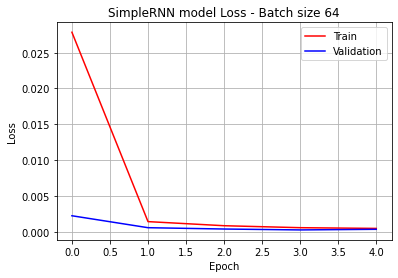


Process for y 

Epoch 1/5
68/68 [==============================] - 7s 44ms/step - loss: 0.0289 - val_loss: 0.0025
Epoch 2/5
68/68 [==============================] - 2s 31ms/step - loss: 0.0015 - val_loss: 6.6609e-04
Epoch 3/5
68/68 [==============================] - 2s 31ms/step - loss: 8.5253e-04 - val_loss: 4.1960e-04
Epoch 4/5
68/68 [==============================] - 2s 30ms/step - loss: 6.5109e-04 - val_loss: 3.7811e-04
Epoch 5/5
68/68 [==============================] - 2s 30ms/step - loss: 6.5922e-04 - val_loss: 2.8331e-04

Root Mean Squared error: 0.07679262542696823.
SNR (dB): 19.838644242731853.

Plot the Loss curves


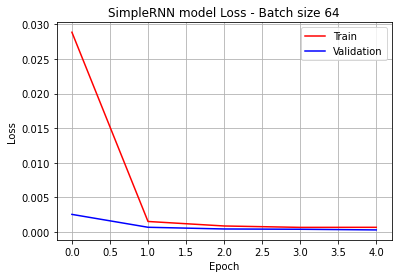

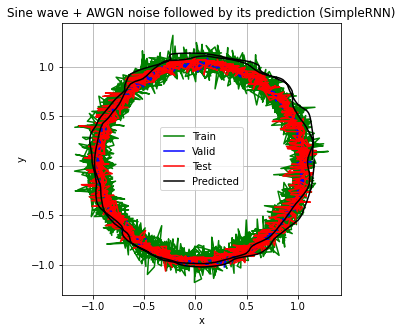


Training for Saw Tooth wave + AWGN noise :


Process for x 

Epoch 1/5
68/68 [==============================] - 7s 45ms/step - loss: 0.0217 - val_loss: 0.0029
Epoch 2/5
68/68 [==============================] - 2s 31ms/step - loss: 0.0012 - val_loss: 4.9872e-04
Epoch 3/5
68/68 [==============================] - 2s 31ms/step - loss: 7.0344e-04 - val_loss: 5.2536e-04
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 5.2460e-04 - val_loss: 3.7854e-04
Epoch 5/5
68/68 [==============================] - 2s 30ms/step - loss: 4.9852e-04 - val_loss: 2.1676e-04

Root Mean Squared error: 0.21876501127546435.
SNR (dB): 28.168060504490427.

Plot the Loss curves


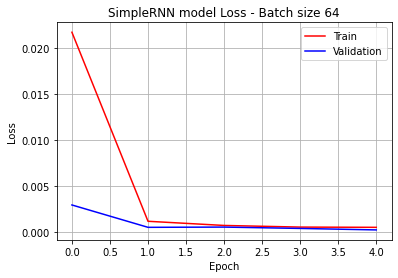


Process for y 

Epoch 1/5
68/68 [==============================] - 7s 45ms/step - loss: 0.0173 - val_loss: 0.0019
Epoch 2/5
68/68 [==============================] - 2s 31ms/step - loss: 0.0011 - val_loss: 6.3636e-04
Epoch 3/5
68/68 [==============================] - 2s 31ms/step - loss: 7.4043e-04 - val_loss: 4.8244e-04
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 5.8270e-04 - val_loss: 2.4395e-04
Epoch 5/5
68/68 [==============================] - 2s 31ms/step - loss: 5.2455e-04 - val_loss: 1.7525e-04

Root Mean Squared error: 0.2981202178078725.
SNR (dB): 25.91810232356029.

Plot the Loss curves


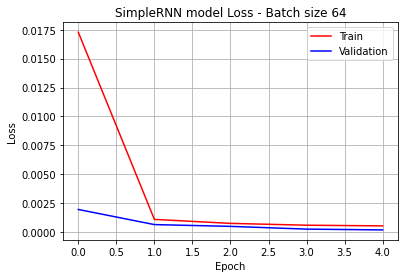

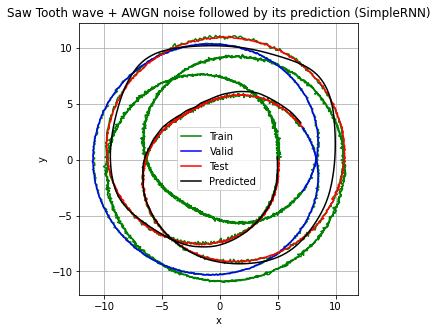


Training for Triangle wave + AWGN noise :


Process for x 

Epoch 1/5
68/68 [==============================] - 7s 50ms/step - loss: 0.0388 - val_loss: 0.0026
Epoch 2/5
68/68 [==============================] - 2s 31ms/step - loss: 0.0019 - val_loss: 5.2209e-04
Epoch 3/5
68/68 [==============================] - 2s 31ms/step - loss: 8.3514e-04 - val_loss: 3.9731e-04
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 7.3523e-04 - val_loss: 4.2215e-04
Epoch 5/5
68/68 [==============================] - 2s 31ms/step - loss: 5.8764e-04 - val_loss: 2.9846e-04

Root Mean Squared error: 0.19531551573601652.
SNR (dB): 27.289466201379557.

Plot the Loss curves


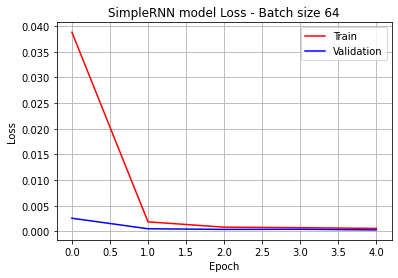


Process for y 

Epoch 1/5
68/68 [==============================] - 7s 45ms/step - loss: 0.0255 - val_loss: 0.0016
Epoch 2/5
68/68 [==============================] - 2s 32ms/step - loss: 0.0012 - val_loss: 3.8079e-04
Epoch 3/5
68/68 [==============================] - 2s 31ms/step - loss: 5.8488e-04 - val_loss: 2.9536e-04
Epoch 4/5
68/68 [==============================] - 2s 31ms/step - loss: 4.2265e-04 - val_loss: 2.2645e-04
Epoch 5/5
68/68 [==============================] - 2s 32ms/step - loss: 3.6299e-04 - val_loss: 1.0298e-04

Root Mean Squared error: 0.1342996776571413.
SNR (dB): 30.390822506647517.

Plot the Loss curves


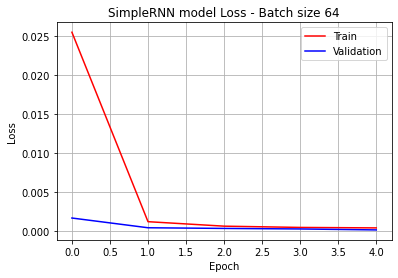

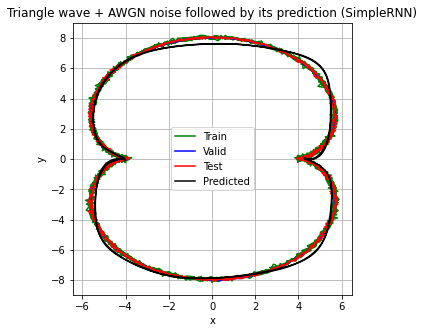

In [ ]:
window_size = 60
EPOCH_COUNT = 5
BATCH_SIZEs = [64,]
LEARNING_RATEs = [0.001]
VAL_split = 0.125

models = ["SimpleRNN"]

signals = [[cir_x_sig, cir_y_sig], [epi_x_sig, epi_y_sig], [nep_x_sig, nep_y_sig]]
signals_noise = [[cir_x_sig_noise, cir_y_sig_noise], [epi_x_sig_noise, epi_y_sig_noise], [nep_x_sig_noise, nep_y_sig_noise]]
signal_sets_lbls = ['Sine wave + AWGN noise', 'Saw Tooth wave + AWGN noise', 'Triangle wave + AWGN noise']

main_process_2d(models, LEARNING_RATEs, BATCH_SIZEs, signals, signals_noise, signal_sets_lbls)

# PART G - Pink Panther:

Music sample rate: 22050 , Music Samples: (661500,) 



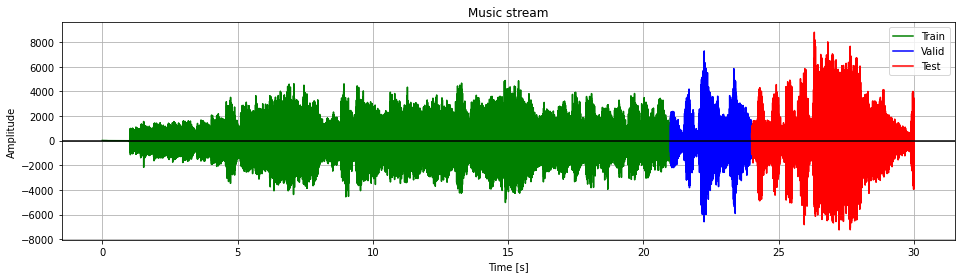

In [ ]:
import math
import requests
import numpy as np
from scipy import signal
from scipy.io import wavfile
import matplotlib.pyplot as plt

import tensorflow as tf
from keras.layers import Input, Dense, LSTM, MaxPooling1D, Dropout, SimpleRNN, Flatten, TimeDistributed
from keras.models import Model, Sequential
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

# Plot waves
def plotter(signals, title, x_ax_lbl, y_ax_lbl, leg_loc="best"):
  plt.figure(figsize=(16, 4))
  for signal in signals:
    plt.plot(signal[0], signal[1], color=signal[2])
  plt.title(title)
  plt.xlabel(x_ax_lbl)
  plt.ylabel(y_ax_lbl)
  plt.legend([signals[i][3] for i in range(len(signals))], loc=leg_loc)
  plt.grid(True, which='both')
  plt.axhline(y=0, color="k")
  plt.show()

# Plot 2d shapes
def plotter_2d(signals, title, x_ax_lbl, y_ax_lbl, leg_loc="best"):
  plt.figure(figsize=(5, 5))
  for signal in signals:
    plt.plot(signal[0], signal[1], color=signal[2])
  plt.title(title)
  plt.xlabel(x_ax_lbl)
  plt.ylabel(y_ax_lbl)
  plt.legend([signals[i][3] for i in range(len(signals))], loc=leg_loc)
  plt.grid(True, which='both')
  plt.show()

# Download File
file_url="https://www2.cs.uic.edu/~i101/SoundFiles/PinkPanther30.wav"
r = requests.get(file_url, stream = True)
path = "audio.wav"
with open(path, "wb") as file: 
    for block in r.iter_content(chunk_size = 1024): 
        if block:
            file.write(block)

# Signal
samplerate, music_sig = wavfile.read(path)
print("Music sample rate:", samplerate, ", Music Samples:", music_sig.shape, "\n")

length = music_sig.shape[0] / samplerate

# Get x values of the sine wave
time = np.linspace(0., length, music_sig.shape[0])
# Create range for train, valid and test parts
tr_range = range(0,int(len(time)* 0.7))
vl_range = range(int(len(time)* 0.7), int(len(time)* 0.8))
te_range = range(int(len(time)* 0.8), len(time))
ranges = [tr_range, vl_range, te_range]
colors = ["g", "b", "r"]
legends = ["Train", "Valid", "Test"]

music_sigs = [[time[ranges[i]], music_sig[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter(music_sigs, "Music stream", 'Time [s]', 'Amplitude')

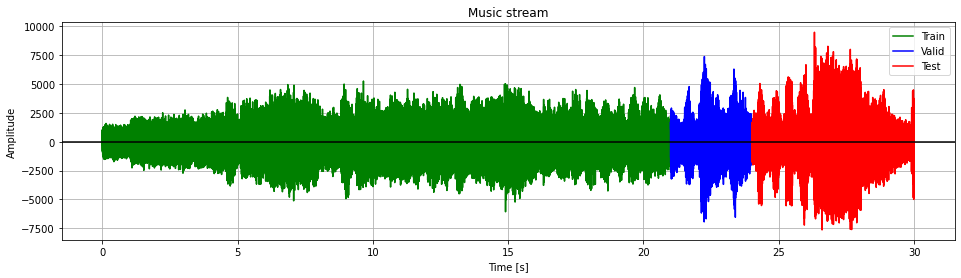

In [ ]:
sigma = 0.05 * max(music_sig)
noise = np.random.normal(0, sigma, len(time))
# Noised Signals
music_sig_noise = noise + music_sig

music_sigs_noise = [[time[ranges[i]], music_sig_noise[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter(music_sigs_noise, "Music stream", 'Time [s]', 'Amplitude')

data = music_sig_noise
wavfile.write("noised_audio.wav", samplerate, data.astype(np.int16))

In [ ]:
# Calculating RMSE
def rms_error(true_signal,predicted):
  return math.sqrt(mean_squared_error(true_signal, predicted))

# Calculating SNR
def snr_db(true_signal, received_signal):
  def power(x):
    return np.mean(x**2)
  noise = received_signal-true_signal
  SN_ratio = power(received_signal)/power(noise)
  return 10*math.log10(SN_ratio)

# plotting model performance
def model_plotter(model_history, metric, model_name, b_s):
  plt.figure()
  plt.plot(model_history.history[metric.lower()],'r')
  plt.plot(model_history.history['val_'+metric.lower()],'b')
  plt.title(model_name + ' model ' + metric.capitalize() + " - Batch size " + str(b_s))
  plt.ylabel(metric.capitalize())
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Validation'], loc='best')
  plt.grid()
  plt.savefig(model_name + "_" + metric.lower() + "_" + str(b_s) + ".png")
  plt.show()

# Creating, Processing, Learning, Predicting, Plotting and whatever...
def main_process_1d(models, LEARNING_RATEs, BATCH_SIZEs, signals, signals_noise, signal_sets_lbls, music_data=False):
  for model_name in models:
    print("\n\n"+model_name, "model:", "\n")
    for LEARNING_RATE in LEARNING_RATEs:
      print("For learning rate ==", LEARNING_RATE,":\n")
      for BATCH_SIZE in BATCH_SIZEs:
        print("For BATCH SIZE ==", BATCH_SIZE,":\n")
        for index, s in enumerate(signals):
          print("Training for", signal_sets_lbls[index], ":\n")
          sc = MinMaxScaler(feature_range=(0,1))
          scaled_signal = sc.fit_transform(s.reshape(-1, 1)).reshape(1, -1)[0]
          scaled_signal_noise = sc.fit_transform(signals_noise[index].reshape(-1, 1)).reshape(1, -1)[0]

          # Train Data
          X_train = []
          y_train = []
          for i in range(window_size, vl_range[-1]):
              X_train.append(scaled_signal[i-window_size:i])
              y_train.append(scaled_signal[i])
          X_train, y_train = np.array(X_train), np.array(y_train)
          X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1)) # E.g. (4338, 60) => (4338, 60, 1)
          # Test Data
          X_test = []
          inputs = scaled_signal_noise[len(time)-len(te_range) - window_size:]
          for i in range(window_size, len(inputs)+1):
              X_test.append(inputs[i-window_size:i])
          X_test = np.array(X_test)
          X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

          if model_name == "simpleRNN":
            # Creating the LSTM Model:
            model = Sequential()
            model.add(SimpleRNN(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
            model.add(Dropout(0.2))
            model.add(SimpleRNN(units=50))
            model.add(Dropout(0.2))
            model.add(Dense(units=1, activation='sigmoid'))
          else:
            # Creating the LSTM Model:
            model = Sequential()
            model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
            model.add(Dropout(0.2))
            model.add(LSTM(units=50))
            model.add(Dropout(0.2))
            model.add(Dense(units=1, activation='sigmoid'))

          # Compiling the LSTM
          model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE), loss='mse')

          # Fitting to the training set
          train_history = model.fit(X_train, y_train, epochs=EPOCH_COUNT, batch_size=BATCH_SIZE, validation_split=VAL_split)

          predicted_signal = model.predict(X_test)
          predicted_signal = np.delete(sc.inverse_transform(predicted_signal), [0])

          # Evaluating our model
          print("\nRoot Mean Squared error: {}.".format(rms_error(s[te_range], predicted_signal)))
          print("SNR (dB): {}.".format(snr_db(s[te_range], predicted_signal)))

          print("\nPlot the Loss curves")
          model_plotter(train_history, 'loss', model_name, BATCH_SIZE)

          # Plot the final results
          signal_sets = [[time[ranges[i]], signals_noise[index][ranges[i]], colors[i], legends[i]] for i in range(3)]
          signal_sets.append([time[ranges[2]], predicted_signal, "k", "Predicted"])
          plotter(signal_sets, signal_sets_lbls[index]+' followed by its prediction ('+ model_name +')', 'Time', 'Amplitude')

          if music_data:
            data = np.concatenate((signals_noise[index][:vl_range[-1]+1], predicted_signal), axis=None)
            wavfile.write("predicted_audio_" + model_name + ".wav", samplerate, data.astype(np.int16))



SimpleRNN model: 

For learning rate == 0.001 :

For BATCH SIZE == 1024 :


Training for Music wave + AWGN noise :

Epoch 1/5
453/453 [==============================] - 11s 20ms/step - loss: 0.0016 - val_loss: 0.0011
Epoch 2/5
453/453 [==============================] - 8s 18ms/step - loss: 4.5224e-04 - val_loss: 9.5223e-04
Epoch 3/5
453/453 [==============================] - 8s 18ms/step - loss: 3.5360e-04 - val_loss: 9.4767e-04
Epoch 4/5
453/453 [==============================] - 8s 18ms/step - loss: 3.2581e-04 - val_loss: 7.6946e-04
Epoch 5/5
453/453 [==============================] - 8s 18ms/step - loss: 2.9218e-04 - val_loss: 6.6684e-04

Root Mean Squared error: 475.51730055277693.
SNR (dB): 11.716851010726806.

Plot the Loss curves


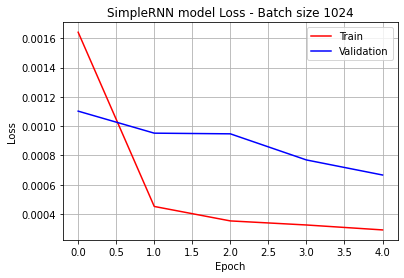

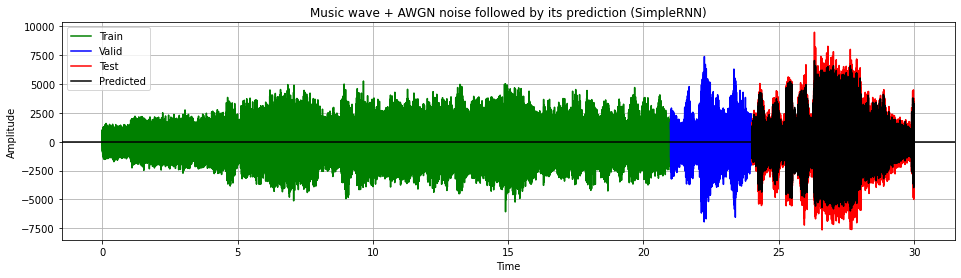



LSTM model: 

For learning rate == 0.001 :

For BATCH SIZE == 1024 :


Training for Music wave + AWGN noise :

Epoch 1/5
453/453 [==============================] - 12s 20ms/step - loss: 0.0017 - val_loss: 0.0013
Epoch 2/5
453/453 [==============================] - 8s 18ms/step - loss: 4.5266e-04 - val_loss: 9.4604e-04
Epoch 3/5
453/453 [==============================] - 8s 18ms/step - loss: 3.4117e-04 - val_loss: 8.4223e-04
Epoch 4/5
453/453 [==============================] - 8s 18ms/step - loss: 3.0909e-04 - val_loss: 7.2799e-04
Epoch 5/5
453/453 [==============================] - 8s 18ms/step - loss: 2.8462e-04 - val_loss: 6.2091e-04

Root Mean Squared error: 457.7766240209301.
SNR (dB): 12.169384464144876.

Plot the Loss curves


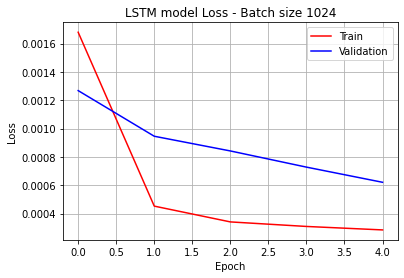

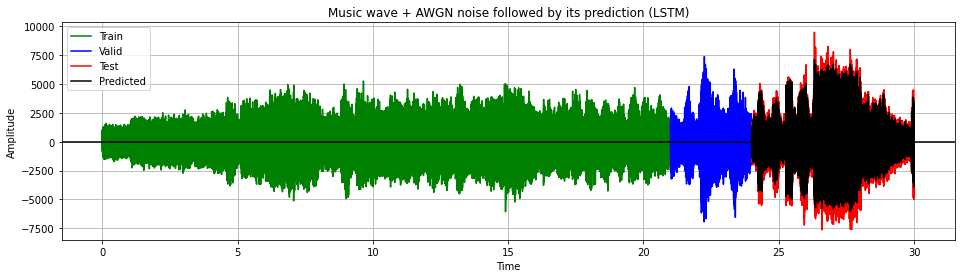

In [ ]:
window_size = 60
EPOCH_COUNT = 5
BATCH_SIZEs = [1024]
LEARNING_RATEs = [0.001]
VAL_split = 0.125

models = ["SimpleRNN", "LSTM"]

signals = [music_sig,]
signals_noise = [music_sig_noise,]
signal_sets_lbls = ['Music wave + AWGN noise',]

main_process_1d(models, LEARNING_RATEs, BATCH_SIZEs, signals, signals_noise, signal_sets_lbls, True)



SimpleRNN model: 

For learning rate == 0.001 :

For BATCH SIZE == 512 :

Training for Music wave + AWGN noise :

Epoch 1/5
905/905 [==============================] - 14s 12ms/step - loss: 0.0010 - val_loss: 9.2315e-04
Epoch 2/5
905/905 [==============================] - 10s 11ms/step - loss: 3.3252e-04 - val_loss: 7.7573e-04
Epoch 3/5
905/905 [==============================] - 10s 11ms/step - loss: 2.7742e-04 - val_loss: 6.1410e-04
Epoch 4/5
905/905 [==============================] - 10s 11ms/step - loss: 2.2749e-04 - val_loss: 4.8047e-04
Epoch 5/5
905/905 [==============================] - 10s 11ms/step - loss: 1.8714e-04 - val_loss: 4.0419e-04

Root Mean Squared error: 609.5263273641262.
SNR (dB): 9.808903274056222.

Plot the Loss curves


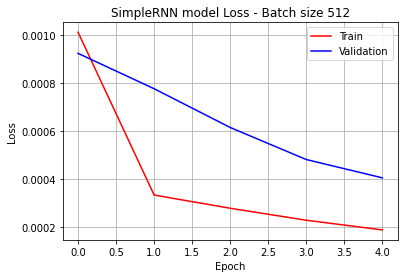

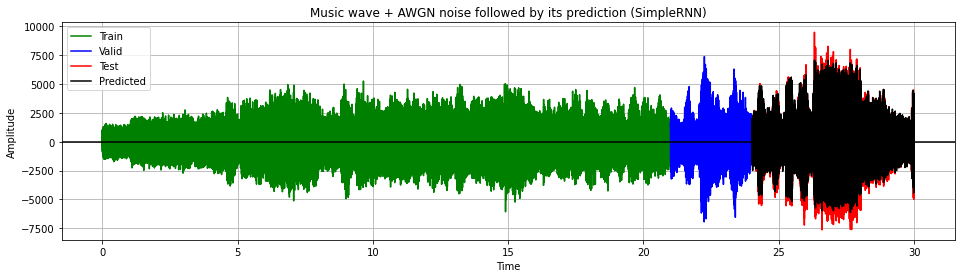

For BATCH SIZE == 1024 :

Training for Music wave + AWGN noise :

Epoch 1/5
453/453 [==============================] - 12s 20ms/step - loss: 0.0016 - val_loss: 0.0011
Epoch 2/5
453/453 [==============================] - 8s 18ms/step - loss: 4.4380e-04 - val_loss: 7.4959e-04
Epoch 3/5
453/453 [==============================] - 8s 18ms/step - loss: 3.6044e-04 - val_loss: 5.8572e-04
Epoch 4/5
453/453 [==============================] - 8s 18ms/step - loss: 2.9225e-04 - val_loss: 5.0630e-04
Epoch 5/5
453/453 [==============================] - 8s 18ms/step - loss: 2.5110e-04 - val_loss: 4.8884e-04

Root Mean Squared error: 596.4268605621313.
SNR (dB): 9.798388932547192.

Plot the Loss curves


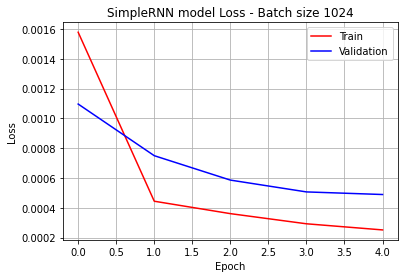

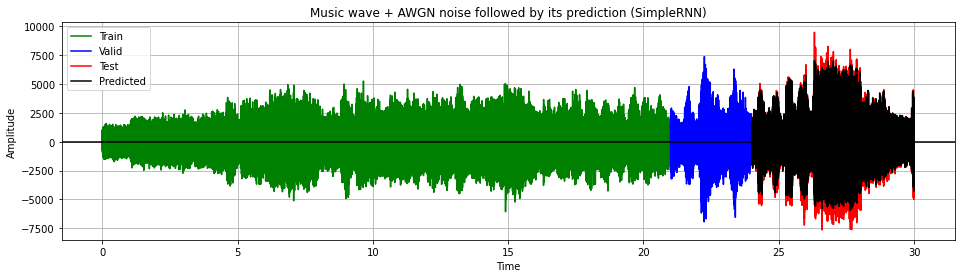

For BATCH SIZE == 2048 :

Training for Music wave + AWGN noise :

Epoch 1/5
227/227 [==============================] - 10s 35ms/step - loss: 0.0025 - val_loss: 0.0017
Epoch 2/5
227/227 [==============================] - 7s 33ms/step - loss: 5.7397e-04 - val_loss: 0.0011
Epoch 3/5
227/227 [==============================] - 7s 32ms/step - loss: 4.5036e-04 - val_loss: 8.5955e-04
Epoch 4/5
227/227 [==============================] - 7s 33ms/step - loss: 4.1779e-04 - val_loss: 7.4287e-04
Epoch 5/5
227/227 [==============================] - 7s 33ms/step - loss: 3.8091e-04 - val_loss: 6.6525e-04

Root Mean Squared error: 486.1323122360825.
SNR (dB): 10.831334599516193.

Plot the Loss curves


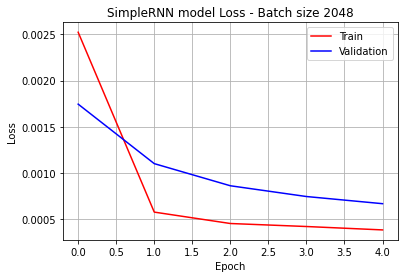

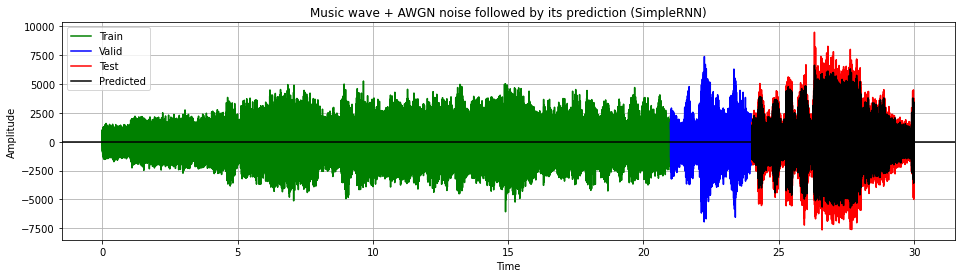

In [ ]:
window_size = 60
EPOCH_COUNT = 5
BATCH_SIZEs = [512, 1024, 2048]
LEARNING_RATEs = [0.001]
VAL_split = 0.125

models = ["SimpleRNN"]

signals = [music_sig,]
signals_noise = [music_sig_noise,]
signal_sets_lbls = ['Music wave + AWGN noise',]

main_process_1d(models, LEARNING_RATEs, BATCH_SIZEs, signals, signals_noise, signal_sets_lbls, True)



SimpleRNN model: 

For learning rate == 0.0001 :

For BATCH SIZE == 1024 :

Training for Music wave + AWGN noise :

Epoch 1/5
453/453 [==============================] - 12s 20ms/step - loss: 0.0039 - val_loss: 0.0064
Epoch 2/5
453/453 [==============================] - 8s 18ms/step - loss: 0.0034 - val_loss: 0.0052
Epoch 3/5
453/453 [==============================] - 8s 19ms/step - loss: 0.0026 - val_loss: 0.0039
Epoch 4/5
453/453 [==============================] - 8s 19ms/step - loss: 0.0014 - val_loss: 0.0020
Epoch 5/5
453/453 [==============================] - 8s 19ms/step - loss: 8.3033e-04 - val_loss: 0.0016

Root Mean Squared error: 698.1776502080255.
SNR (dB): 6.480647105157516.

Plot the Loss curves


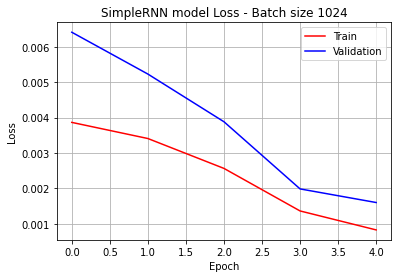

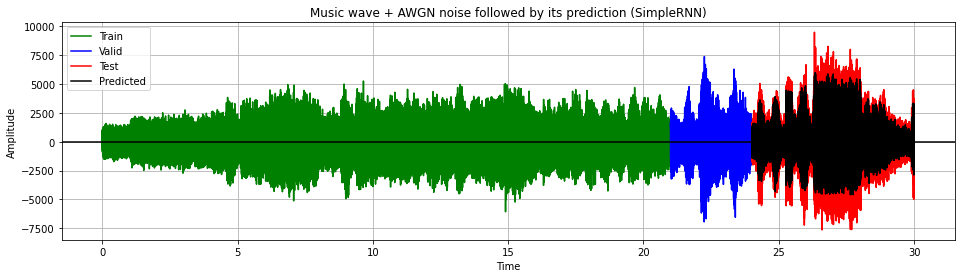

For learning rate == 0.001 :

For BATCH SIZE == 1024 :

Training for Music wave + AWGN noise :

Epoch 1/5
453/453 [==============================] - 12s 20ms/step - loss: 0.0016 - val_loss: 0.0012
Epoch 2/5
453/453 [==============================] - 8s 19ms/step - loss: 4.2518e-04 - val_loss: 9.7329e-04
Epoch 3/5
453/453 [==============================] - 8s 19ms/step - loss: 3.5029e-04 - val_loss: 9.4156e-04
Epoch 4/5
453/453 [==============================] - 8s 19ms/step - loss: 3.2160e-04 - val_loss: 7.8795e-04
Epoch 5/5
453/453 [==============================] - 8s 19ms/step - loss: 2.9048e-04 - val_loss: 6.5682e-04

Root Mean Squared error: 465.42512488584026.
SNR (dB): 11.901414297013277.

Plot the Loss curves


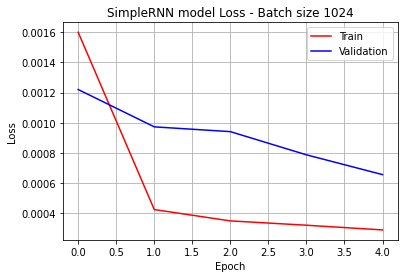

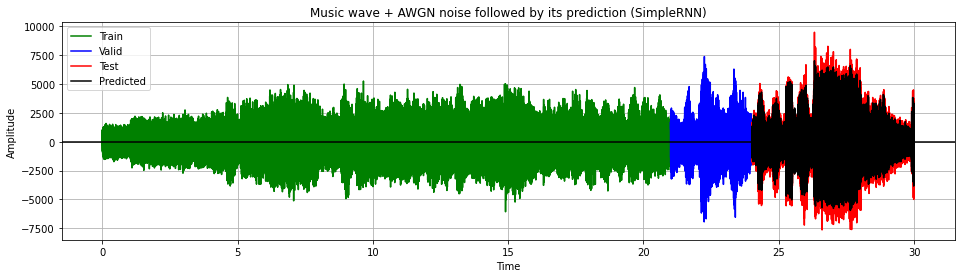

For learning rate == 0.01 :

For BATCH SIZE == 1024 :

Training for Music wave + AWGN noise :

Epoch 1/5
453/453 [==============================] - 12s 20ms/step - loss: 0.0011 - val_loss: 6.0163e-04
Epoch 2/5
453/453 [==============================] - 8s 19ms/step - loss: 2.7301e-04 - val_loss: 3.5968e-04
Epoch 3/5
453/453 [==============================] - 8s 19ms/step - loss: 2.2840e-04 - val_loss: 5.1662e-04
Epoch 4/5
453/453 [==============================] - 8s 19ms/step - loss: 2.1548e-04 - val_loss: 4.2079e-04
Epoch 5/5
453/453 [==============================] - 8s 19ms/step - loss: 1.7893e-04 - val_loss: 3.7524e-04

Root Mean Squared error: 632.4759629819935.
SNR (dB): 9.558499373842107.

Plot the Loss curves


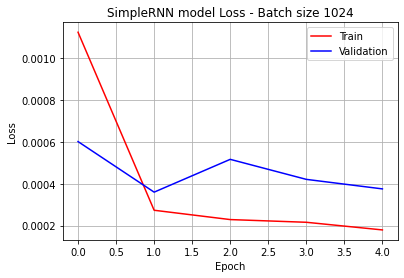

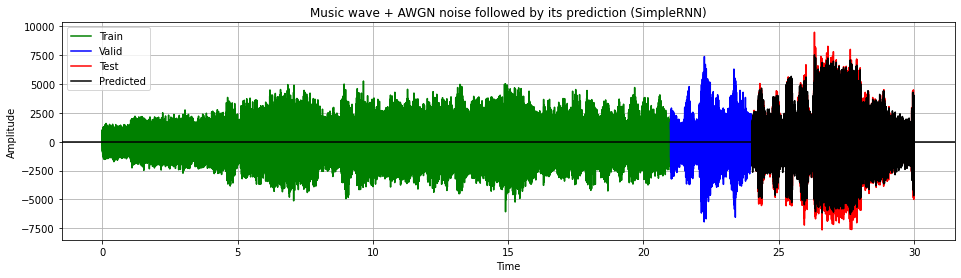

In [ ]:
window_size = 60
EPOCH_COUNT = 5
BATCH_SIZEs = [1024]
LEARNING_RATEs = [0.0001, 0.001, 0.01]
VAL_split = 0.125

models = ["SimpleRNN"]

signals = [music_sig,]
signals_noise = [music_sig_noise,]
signal_sets_lbls = ['Music wave + AWGN noise',]

main_process_1d(models, LEARNING_RATEs, BATCH_SIZEs, signals, signals_noise, signal_sets_lbls, True)

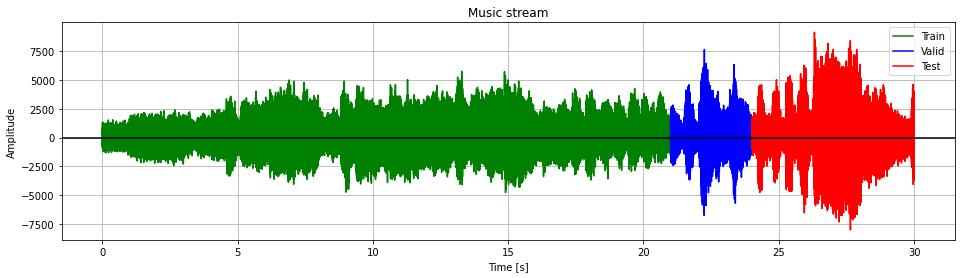

In [ ]:
sigma = 0.05 * max(music_sig)
noise_vecs = [np.random.normal(np.random.random()*sigma, np.random.random()*sigma, int(len(time)/10)) for i in range(10)]
noise_vecs.append(np.random.normal(np.random.random()*sigma, np.random.random()*sigma, len(time)-sum([n.shape[0] for n in noise_vecs])))
noise = np.concatenate(noise_vecs, axis=None)

# Noised Signals
music_sig_noise = noise + music_sig

music_sigs_noise = [[time[ranges[i]], music_sig_noise[ranges[i]], colors[i], legends[i]] for i in range(3)]
plotter(music_sigs_noise, "Music stream", 'Time [s]', 'Amplitude')

data = music_sig_noise
wavfile.write("noised_audio.wav", samplerate, data.astype(np.int16))



SimpleRNN model: 

For learning rate == 0.001 :

For BATCH SIZE == 1024 :

Training for Music wave + non-stationary AWGN noise :

Epoch 1/5
453/453 [==============================] - 11s 19ms/step - loss: 0.0015 - val_loss: 0.0011
Epoch 2/5
453/453 [==============================] - 8s 18ms/step - loss: 4.2607e-04 - val_loss: 8.4267e-04
Epoch 3/5
453/453 [==============================] - 8s 18ms/step - loss: 3.3697e-04 - val_loss: 9.2801e-04
Epoch 4/5
453/453 [==============================] - 8s 18ms/step - loss: 3.2170e-04 - val_loss: 7.9825e-04
Epoch 5/5
453/453 [==============================] - 8s 18ms/step - loss: 3.1038e-04 - val_loss: 8.5719e-04

Root Mean Squared error: 467.5862888280622.
SNR (dB): 11.598161595013687.

Plot the Loss curves


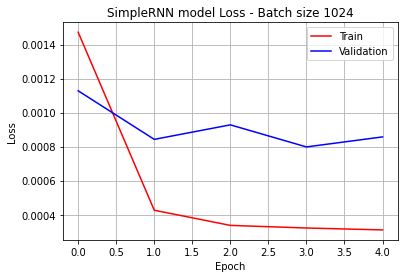

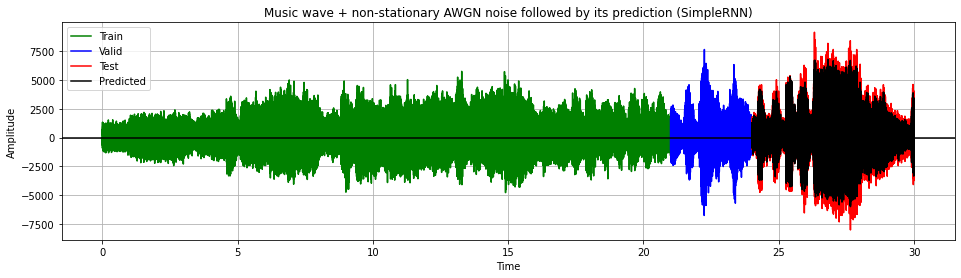

In [ ]:
window_size = 60
EPOCH_COUNT = 5
BATCH_SIZEs = [1024]
LEARNING_RATEs = [0.001]
VAL_split = 0.125

models = ["SimpleRNN"]

signals = [music_sig,]
signals_noise = [music_sig_noise,]
signal_sets_lbls = ['Music wave + non-stationary AWGN noise',]

main_process_1d(models, LEARNING_RATEs, BATCH_SIZEs, signals, signals_noise, signal_sets_lbls, True)

# Part H - Image:

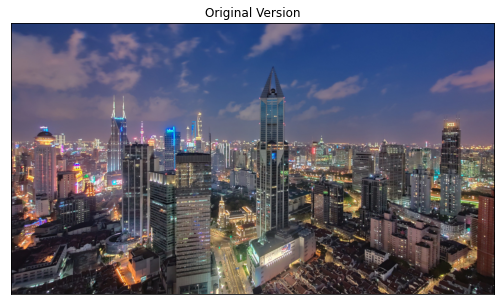

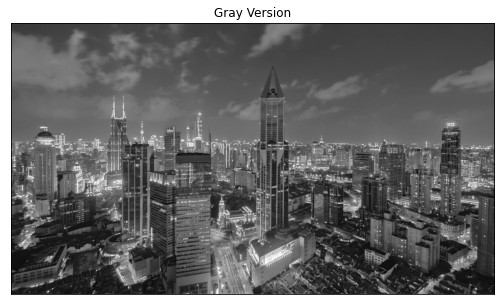

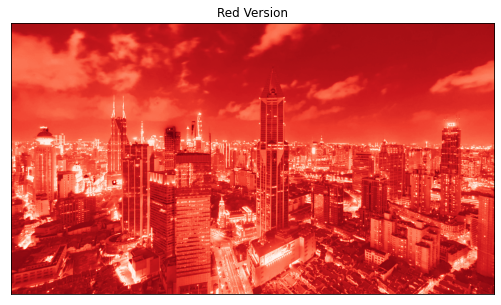

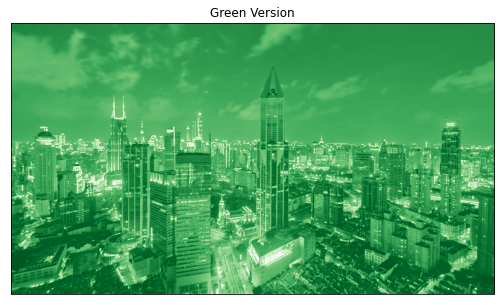

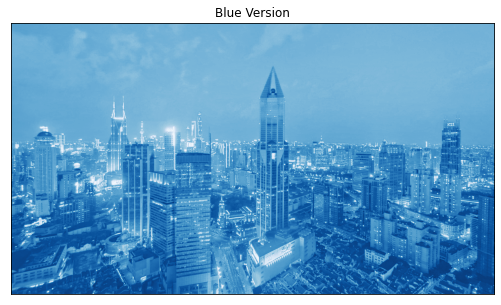

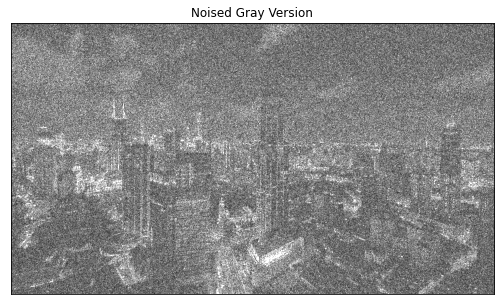

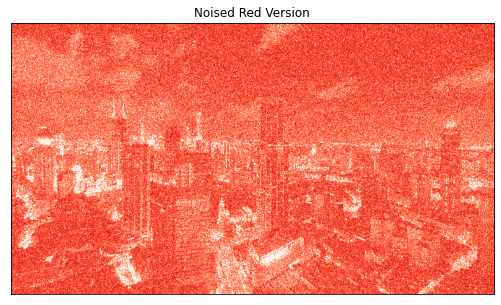

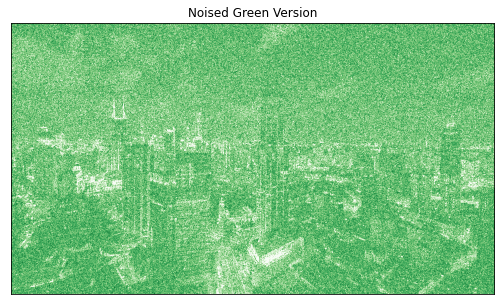

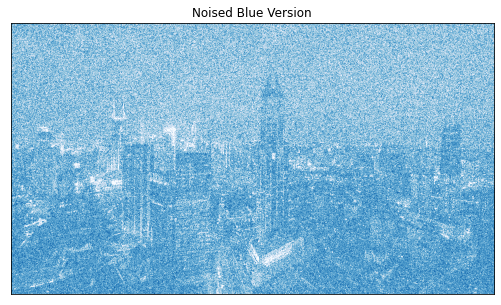


Each channel shape: (1080, 1920) - Each flatted channel shape: (2073600,)


In [6]:
import math
import requests
import numpy as np
from PIL import Image
from scipy import signal
import matplotlib.pyplot as plt

import tensorflow as tf
from keras.layers import Input, Dense, LSTM, MaxPooling1D, Dropout, SimpleRNN, Flatten, TimeDistributed
from keras.models import Model, Sequential
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

def plot_image(images, image_title, channel):
  for index, image in enumerate(images):
    plt.figure(figsize=(10, 5))
    case = channel[index]
    if case == "gray":
      plt.imshow(np.abs(image), cmap=plt.get_cmap('gray'), vmin=0, vmax=255)
    elif case == "red":
      plt.imshow(np.abs(image), cmap=plt.get_cmap('Reds_r'), vmin=0, vmax=255)
    elif case == "green":
      plt.imshow(np.abs(image), cmap=plt.get_cmap('Greens_r'), vmin=0, vmax=255)
    elif case == "blue":
      plt.imshow(np.abs(image), cmap=plt.get_cmap('Blues_r'), vmin=0, vmax=255)
    else:
      plt.imshow(image)
    plt.title(image_title[index]), plt.xticks([]), plt.yticks([])
    plt.show()

# Reading the image
pic_name = "city-sample.jpg"

img = Image.open(pic_name)
gray_img = img.convert('L')
r_img = img.getchannel(0)
g_img = img.getchannel(1)
b_img = img.getchannel(2)


images = [img, gray_img, r_img, g_img, b_img]
titles = ["Original Version", "Gray Version", "Red Version", "Green Version", "Blue Version"]
channels = ["none", "gray", "red", "green", "blue"]
plot_image(images, titles, channels)

# Noise:
images_noise = []
sigma = 0.5 * 256
noise = np.random.normal(0, sigma, np.array(gray_img).shape)
images_noise = [noise + images[k+1] for k in range(4)]
titles_noise = ["Noised "+titles[k+1] for k in range(4)]
channels_noise = ["gray", "red", "green", "blue"]
plot_image(images_noise, titles_noise, channels_noise)

images_np = [np.array(img) for img in images]
flatted_images = [img.flatten() for img in images_np]
flatted_images_noise = [img.flatten() for img in images_noise]
print("\nEach channel shape:", images_np[1].shape, "- Each flatted channel shape:", flatted_images[1].shape)

In [21]:
# Calculating RMSE
def rms_error(true_signal,predicted):
  return math.sqrt(mean_squared_error(true_signal, predicted))

# Calculating SNR
def snr_db(true_signal, received_signal):
  def power(x):
    return np.mean(x**2)
  noise = received_signal-true_signal
  SN_ratio = power(received_signal)/power(noise)
  return 10*math.log10(SN_ratio)

# plotting model performance
def model_plotter(model_history, metric, model_name, b_s):
  plt.figure()
  plt.plot(model_history.history[metric.lower()],'r')
  plt.plot(model_history.history['val_'+metric.lower()],'b')
  plt.title(model_name + ' model ' + metric.capitalize() + " - Batch size " + str(b_s))
  plt.ylabel(metric.capitalize())
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Validation'], loc='best')
  plt.grid()
  plt.savefig(model_name + "_" + metric.lower() + "_" + str(b_s) + ".png")
  plt.show()

# Creating, Processing, Learning, Predicting, Plotting and whatever...
def main_process_1d(models, LEARNING_RATEs, BATCH_SIZEs, signals, signals_noise, signal_sets_lbls, music_data=False):
  results = []
  for model_name in models:
    print("\n\n"+model_name, "model:", "\n")
    for LEARNING_RATE in LEARNING_RATEs:
      print("For learning rate ==", LEARNING_RATE,":\n")
      for BATCH_SIZE in BATCH_SIZEs:
        print("For BATCH SIZE ==", BATCH_SIZE,":\n")
        for index, s in enumerate(signals):
          print("Training for", signal_sets_lbls[index], ":\n")
          sc = MinMaxScaler(feature_range=(0,1))
          scaled_signal = sc.fit_transform(s.reshape(-1, 1)).reshape(1, -1)[0]
          scaled_signal_noise = sc.fit_transform(signals_noise[index].reshape(-1, 1)).reshape(1, -1)[0]

          # Train Data
          X_train = []
          y_train = []
          for i in range(window_size, vl_range[-1]):
              X_train.append(scaled_signal[i-window_size:i])
              y_train.append(scaled_signal[i])
          X_train, y_train = np.array(X_train), np.array(y_train)
          X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1)) # E.g. (4338, 60) => (4338, 60, 1)
          # Test Data
          X_test = []
          inputs = scaled_signal_noise[len(pixels)-len(te_range) - window_size:]
          for i in range(window_size, len(inputs)+1):
              X_test.append(inputs[i-window_size:i])
          X_test = np.array(X_test)
          X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))

          if model_name == "simpleRNN":
            # Creating the LSTM Model:
            model = Sequential()
            model.add(SimpleRNN(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
            model.add(Dropout(0.2))
            model.add(SimpleRNN(units=50))
            model.add(Dropout(0.2))
            model.add(Dense(units=1, activation='sigmoid'))
          else:
            # Creating the LSTM Model:
            model = Sequential()
            model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1],1)))
            model.add(Dropout(0.2))
            model.add(LSTM(units=50))
            model.add(Dropout(0.2))
            model.add(Dense(units=1, activation='sigmoid'))

          # Compiling the LSTM
          model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE), loss='mse')

          # Fitting to the training set
          train_history = model.fit(X_train, y_train, epochs=EPOCH_COUNT, batch_size=BATCH_SIZE, validation_split=VAL_split)

          predicted_signal = model.predict(X_test)
          predicted_signal = np.delete(sc.inverse_transform(predicted_signal), [0])

          # Evaluating our model
          print("\nRoot Mean Squared error: {}.".format(rms_error(s[te_range], predicted_signal)))
          print("SNR (dB): {}.".format(snr_db(s[te_range], predicted_signal)))

          print("\nPlot the Loss curves")
          model_plotter(train_history, 'loss', model_name, BATCH_SIZE)

          data = np.concatenate((signals_noise[index][:vl_range[-1]+1], predicted_signal), axis=None)
          if music_data:
            wavfile.write("predicted_audio_" + model_name + ".wav", samplerate, data.astype(np.int16))
          results.append(data)
  return results


In [23]:
# Get x values of the sine wave
channel_len = flatted_images[1].shape[0]
pixels = np.arange(0, channel_len, 1)
# Create range for train, valid and test parts
tr_range = range(0,int(len(pixels)* 0.7))
vl_range = range(int(len(pixels)* 0.7), int(len(pixels)* 0.8))
te_range = range(int(len(pixels)* 0.8), len(pixels))
ranges = [tr_range, vl_range, te_range]
colors = ["g", "b", "r"]
legends = ["Train", "Valid", "Test"]



SimpleRNN model: 

For learning rate == 0.001 :

For BATCH SIZE == 8000 :

Training for gray pixels + AWGN noise :

Epoch 1/3
182/182 [==============================] - 176s 913ms/step - loss: 0.0109 - val_loss: 0.0123
Epoch 2/3
182/182 [==============================] - 163s 896ms/step - loss: 0.0048 - val_loss: 0.0059
Epoch 3/3
182/182 [==============================] - 162s 891ms/step - loss: 0.0025 - val_loss: 0.0034

Root Mean Squared error: 148.76457386589053.
SNR (dB): 1.2130747037714036.

Plot the Loss curves


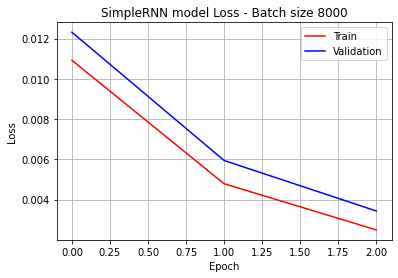

Training for red pixels + AWGN noise :

Epoch 1/3
182/182 [==============================] - 172s 922ms/step - loss: 0.0141 - val_loss: 0.0133
Epoch 2/3
182/182 [==============================] - 163s 897ms/step - loss: 0.0057 - val_loss: 0.0067
Epoch 3/3
182/182 [==============================] - 162s 893ms/step - loss: 0.0029 - val_loss: 0.0035

Root Mean Squared error: 147.9781774979845.
SNR (dB): 1.3513273026733779.

Plot the Loss curves


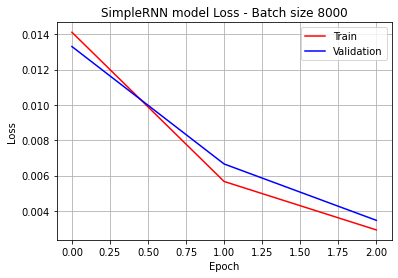

Training for green pixels + AWGN noise :

Epoch 1/3
182/182 [==============================] - 173s 926ms/step - loss: 0.0110 - val_loss: 0.0115
Epoch 2/3
182/182 [==============================] - 164s 899ms/step - loss: 0.0045 - val_loss: 0.0051
Epoch 3/3
182/182 [==============================] - 160s 881ms/step - loss: 0.0023 - val_loss: 0.0034

Root Mean Squared error: 167.2486570387039.
SNR (dB): 0.8699472854878623.

Plot the Loss curves


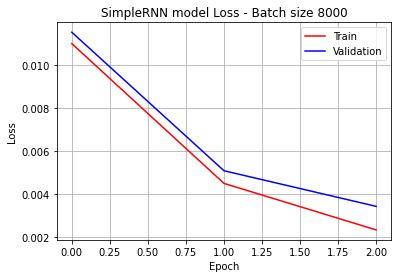

Training for blue pixels + AWGN noise :

Epoch 1/3
182/182 [==============================] - 170s 915ms/step - loss: 0.0069 - val_loss: 0.0095
Epoch 2/3
182/182 [==============================] - 166s 912ms/step - loss: 0.0033 - val_loss: 0.0037
Epoch 3/3
182/182 [==============================] - 167s 921ms/step - loss: 0.0019 - val_loss: 0.0033

Root Mean Squared error: 163.7819029036786.
SNR (dB): 0.8645535382016383.

Plot the Loss curves


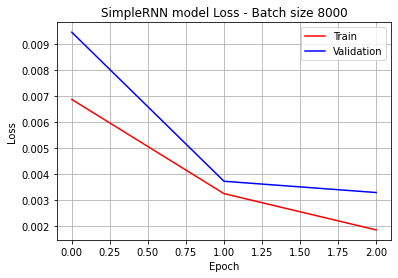

In [24]:
window_size = 10
EPOCH_COUNT = 3
BATCH_SIZEs = [8000]
LEARNING_RATEs = [0.001]
VAL_split = 0.125

models = ["SimpleRNN"]

signals = [flatted_images[i+1] for i in range(4)]
signals_noise = [flatted_images_noise[i] for i in range(4)]
signal_sets_lbls = [channels[i+1]+' pixels + AWGN noise' for i in range(4)]

results = main_process_1d(models, LEARNING_RATEs, BATCH_SIZEs, signals, signals_noise, signal_sets_lbls)

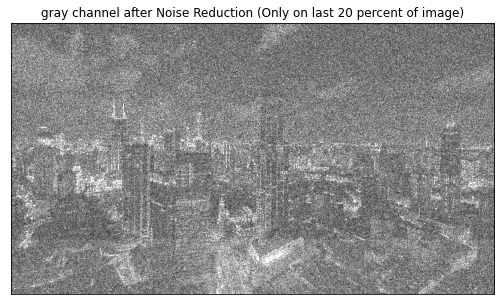

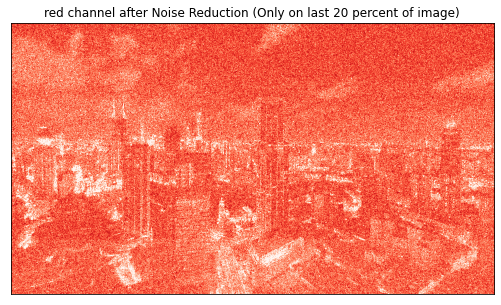

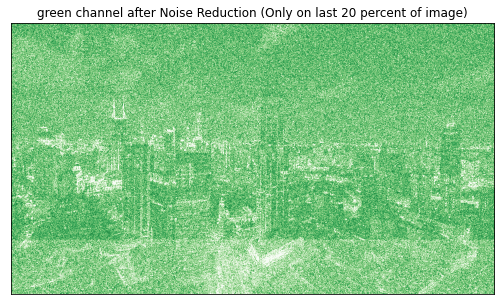

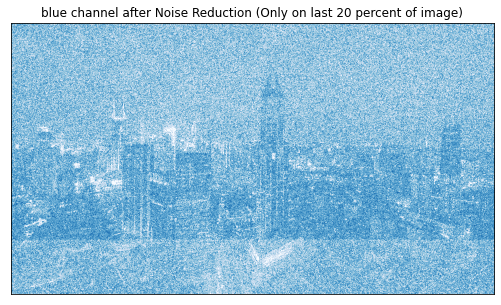

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


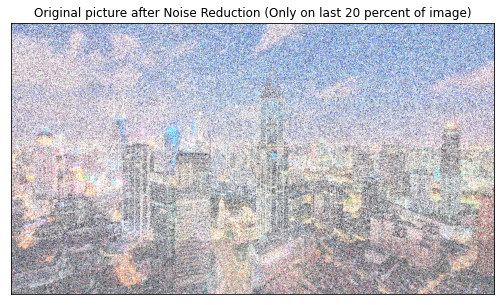

In [31]:
resulted_images = []
for result in results:
  resulted_images.append(result.reshape(1080,-1))
resulted_titles = [channels_noise[i]+" channel after Noise Reduction (Only on last 20 percent of image)" for i in range(4)]
plot_image(resulted_images, resulted_titles, channels_noise)
rgb = np.dstack((resulted_image[1],resulted_image[2],resulted_image[3]))
plot_image([rgb], ['Original picture after Noise Reduction (Only on last 20 percent of image)'], ["original"])